<!-- # Example notebook for conformal/disformal coupled DE–DM models computed within CLASS-DExDM

This notebook is a clean, minimal tutorial on how to use CLASS-DExDM as an extension of CLASS. 
It shows how to:
- run a baseline LCDM model and a coupled DE-DM coupled model with different parameters,
- compute and plot background quantities
- compute and plot perturbed quantities
- compute and plot observables like CMB spectra and the matter power spectrum -->

In [1]:
# %matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from classy import Class

import vapeplot 
import lovelyplots  


# Plot styling
plt.style.use('bmh')
plt.style.use(['ipynb', 'use_mathtext', 'colors5-light'])

lw = 2.5
ls = ['--', '-', '-.', ':', (0, (5, 1))]
boolean = False  # legend frame
plt.rcParams['legend.frameon'] = boolean


In [2]:
def run_class(params):
    cosmo = Class()
    cosmo.set(params)
    cosmo.compute()
    return cosmo


def cleanup(cosmo):
    cosmo.struct_cleanup()
    cosmo.empty()

<!-- ## 1) Define cosmologies

We start with an example of a standard LCDM baseline and a coupled DE-DM model -->


In [3]:
common = {
    # shared parameters
    'omega_b': 2.255065e-02,
    'h': 0.67810,
    'A_s': 2.123257e-09,
    'n_s': 0.9665,
    'tau_reio': 0.0543,

    # Output settings
    'output': 'tCl,pCl,lCl,mPk',
    'lensing': 'yes',
    'l_max_scalars': 2500,
    'P_k_max_h/Mpc': 10.0,
    'z_pk': '0,1,3',
    'k_output_values': '0.05',
}

# LCDM baseline
lcdm_params = dict(common)
lcdm_params.update({
    'omega_cdm': 1.193524e-01,
})

# Coupled SCF–IDM model (example)
coupled_params = dict(common)
coupled_params.update({
    # keep a tiny omega_cdm only to define the gauge
    'omega_cdm': 1e-10,
    # IDM carries the coupled component
    'omega_qcdm': 1.193524e-01,

    # enable SCF + coupling
    'Omega_scf': -1,        
    'Omega_Lambda': 0,
    'Omega_fld': 0,

    'scf_potential': 'exp',
    'scf_coupling_type': 'conformal',

    # explicit SCF potential/coupling parameters
    'scf_V0': 1.0,
    'scf_lambda': 0.1,
    'scf_beta': 0.1,
    'scf_C0': 1.0,

    # initial conditions (turn off attractor to specify explicitly)
    'attractor_ic_scf': 'no',
    'scf_phi_ini': 1.0,
    'scf_phi_prime_ini': -1e-8,

    # shooting target (can also be V0/lambda/beta/...)
    'scf_shooting_target': 'scf_V0',
})
conformal_params = dict(common)
conformal_params.update({
    # keep a tiny omega_cdm only to define the gauge
    'omega_cdm': 1e-10,
    # IDM carries the coupled component
    'omega_qcdm': 1.193524e-01,

    # enable SCF + coupling
    'Omega_scf': -1,        
    'Omega_Lambda': 0,
    'Omega_fld': 0,

    'scf_potential': 'exp',
    'scf_coupling_type': 'conformal',

    # explicit SCF potential/coupling parameters
    'scf_V0': 1.0,
    'scf_lambda': 0.1,
    'scf_beta': -0.05,
    'scf_C0': 1.0,

    # initial conditions (turn off attractor to specify explicitly)
    'attractor_ic_scf': 'no',
    'scf_phi_ini': 1.0,
    'scf_phi_prime_ini': -1e-8,

    # shooting target (can also be V0/lambda/beta/...)
    'scf_shooting_target': 'scf_V0',
})


# Disformal SCF–IDM model (example)
disformal_params = dict(common)
disformal_params.update({
    # keep a tiny omega_cdm only to define the gauge
    'omega_cdm': 1e-10,
    # IDM carries the coupled component
    'omega_qcdm': 1.193524e-01,

    # enable SCF + coupling
    'Omega_scf': -1,
    'Omega_Lambda': 0,
    'Omega_fld': 0,

    'scf_potential': 'exp',
    'scf_coupling_type': 'disformal',

    # explicit SCF potential/coupling parameters
    'scf_V0': 1.0,
    'scf_lambda': 1.,
    'scf_alpha': 0.,
    'scf_D0': 2.0,

    # initial conditions
    'attractor_ic_scf': 'no',
    'scf_phi_ini': 1.0,
    'scf_phi_prime_ini': 0.,

    # shooting target
    'scf_shooting_target': 'scf_V0',
})


<!-- ## 2) Run CLASS -->


In [4]:
lcdm = run_class(lcdm_params)
coup = run_class(coupled_params)
conf = run_class(conformal_params)
disf = run_class(disformal_params)


<!-- ## 3) Derived parameters -->


In [5]:
def print_derived(tag, cosmo):
    params = ['sigma8', 'Omega_m', 'Omega_Lambda', 'age']
    try:
        derived = cosmo.get_current_derived_parameters(params)
    except Exception:
        derived = cosmo.get_current_derived_parameters(['sigma8', 'S8'])
    print(f"{tag}: {derived}")

print_derived('LCDM', lcdm)
print_derived('Coupled', coup)
# print_derived('Disformal', disf)


LCDM: {'sigma8': 0.8251966405224376, 'Omega_m': 0.3086059117835361, 'Omega_Lambda': 0.6913031267598921, 'age': 13.786561333049878}
Coupled: {'sigma8': 0.9662011673037613, 'Omega_m': 0.3086059761436311, 'Omega_Lambda': 0.0, 'age': 13.734047033527164}


<!-- ## 4) Background evolution -->


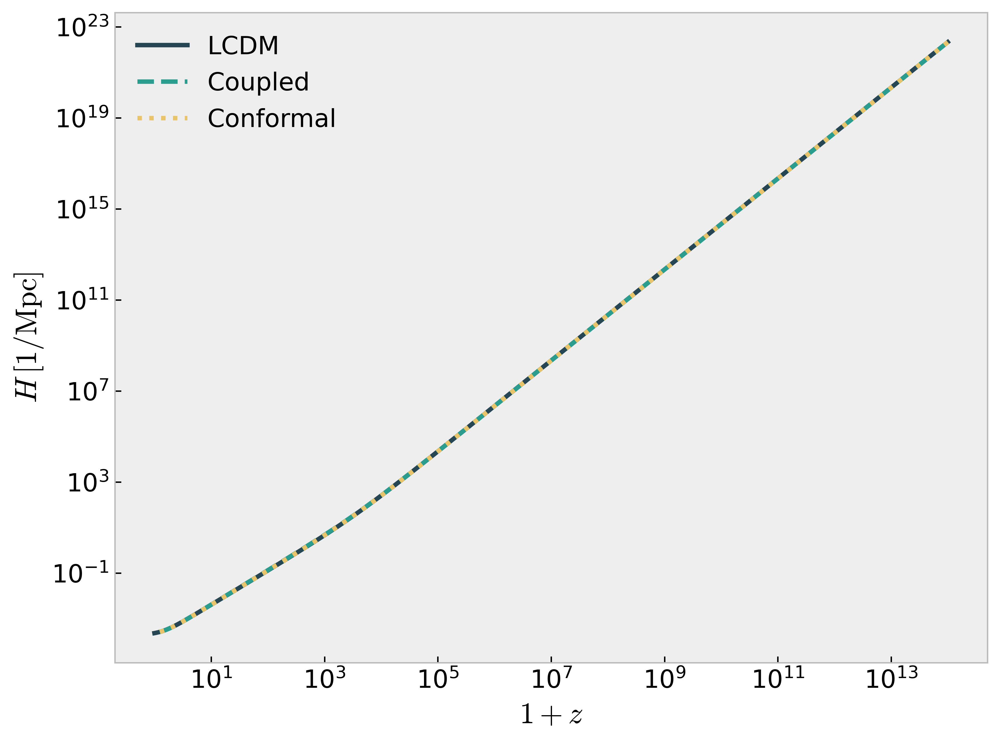

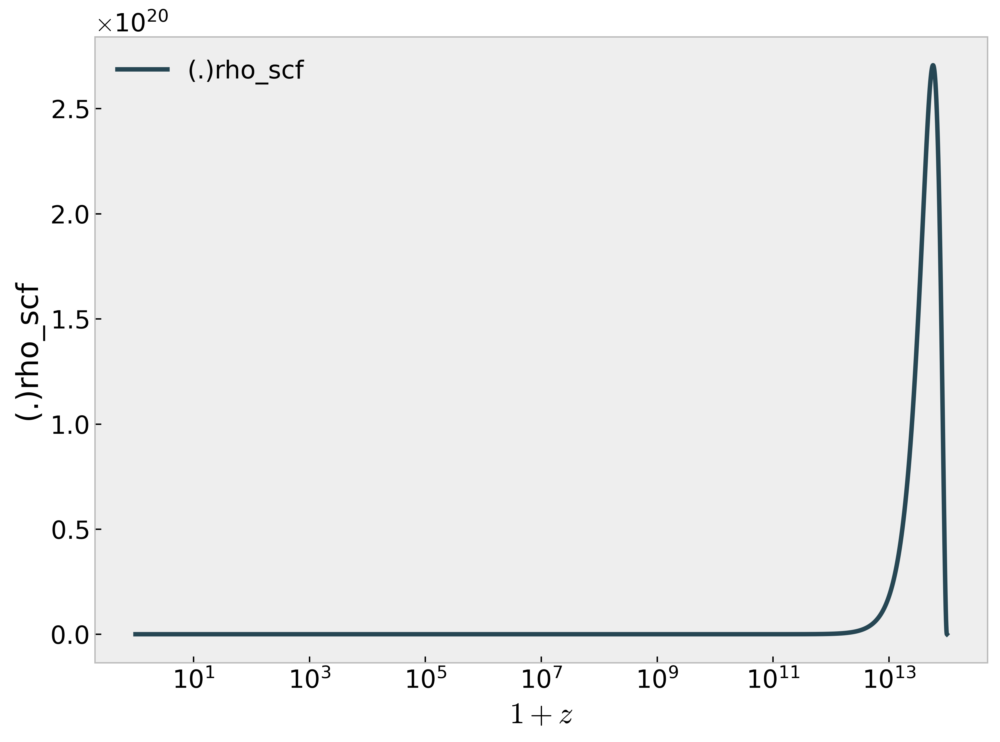

In [6]:
bg_lcdm = lcdm.get_background()
bg_coup = coup.get_background()
bg_conf = conf.get_background()
# helper to find available background fields

def get_bg_field(bg, keys):
    for k in keys:
        if k in bg:
            return bg[k], k
    return None, None

z = bg_coup['z']

# H(z)
plt.figure(figsize=(8, 6))
plt.loglog(1+z, bg_lcdm['H [1/Mpc]'], lw=lw, ls='-', label='LCDM')
plt.loglog(1+z, bg_coup['H [1/Mpc]'], lw=lw, ls='--', label='Coupled')
plt.loglog(1+z, bg_conf['H [1/Mpc]'], lw=lw, ls=':', label='Conformal')
plt.xlabel(r'$1+z$')
plt.ylabel(r'$H\,[1/\mathrm{Mpc}]$')
plt.legend()
plt.tight_layout()

# Omega_scf or rho_scf (depending on output keys)
plt.figure(figsize=(8, 6))
vals, label = get_bg_field(bg_coup, ['Omega_scf', '(.)Omega_scf', '(.)rho_scf'])
if vals is not None:
    plt.semilogx(1+z, vals, lw=lw, ls='-', label=label)
    plt.xlabel(r'$1+z$')
    plt.ylabel(label)
    plt.legend()
    plt.tight_layout()
else:
    print('No SCF background field found (keys may differ).')


<!-- ## 5) CMB spectra -->


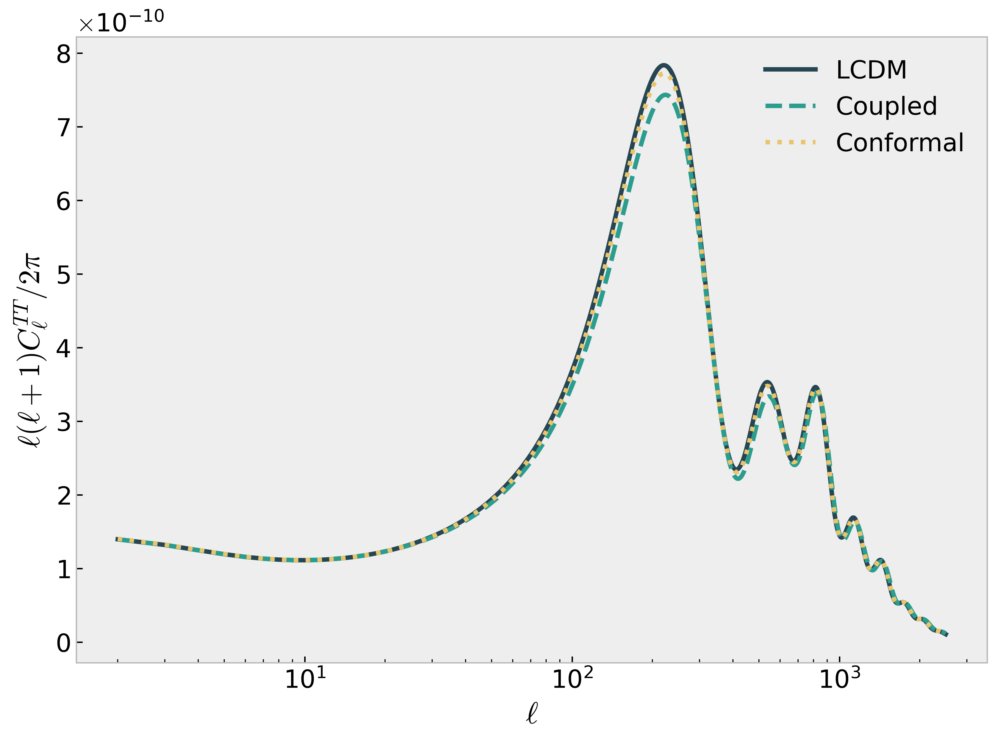

In [7]:
cls_lcdm = lcdm.lensed_cl(2500)
cls_coup = coup.lensed_cl(2500)
cls_conf = conf.lensed_cl(2500)

ell = cls_lcdm['ell'][2:]
cltt_lcdm = cls_lcdm['tt'][2:]
cltt_coup = cls_coup['tt'][2:]
cltt_conf = cls_conf['tt'][2:]

plt.figure(figsize=(8, 6))
plt.xscale('log')
plt.plot(ell, cltt_lcdm*ell*(ell+1)/(2*np.pi), lw=lw, ls='-', label='LCDM')
plt.plot(ell, cltt_coup*ell*(ell+1)/(2*np.pi), lw=lw, ls='--', label='Coupled')
plt.plot(ell, cltt_conf*ell*(ell+1)/(2*np.pi), lw=lw, ls=':', label='Conformal')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell(\ell+1)C_\ell^{TT}/2\pi$')
plt.legend()
plt.tight_layout()


<!-- ## 6) Matter power spectrum -->


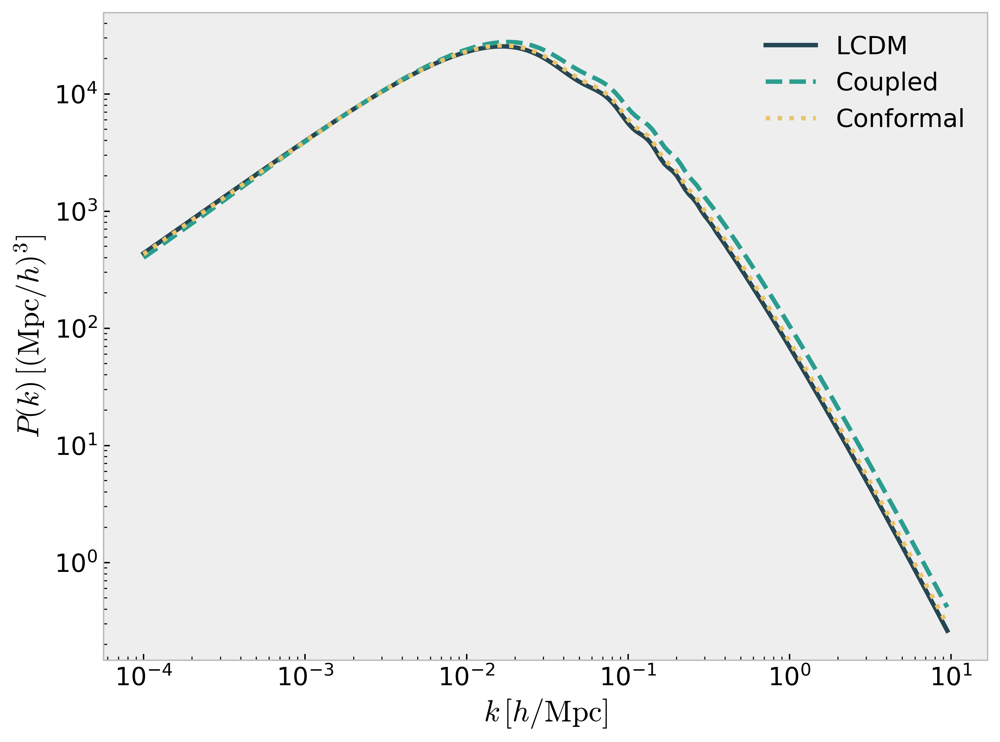

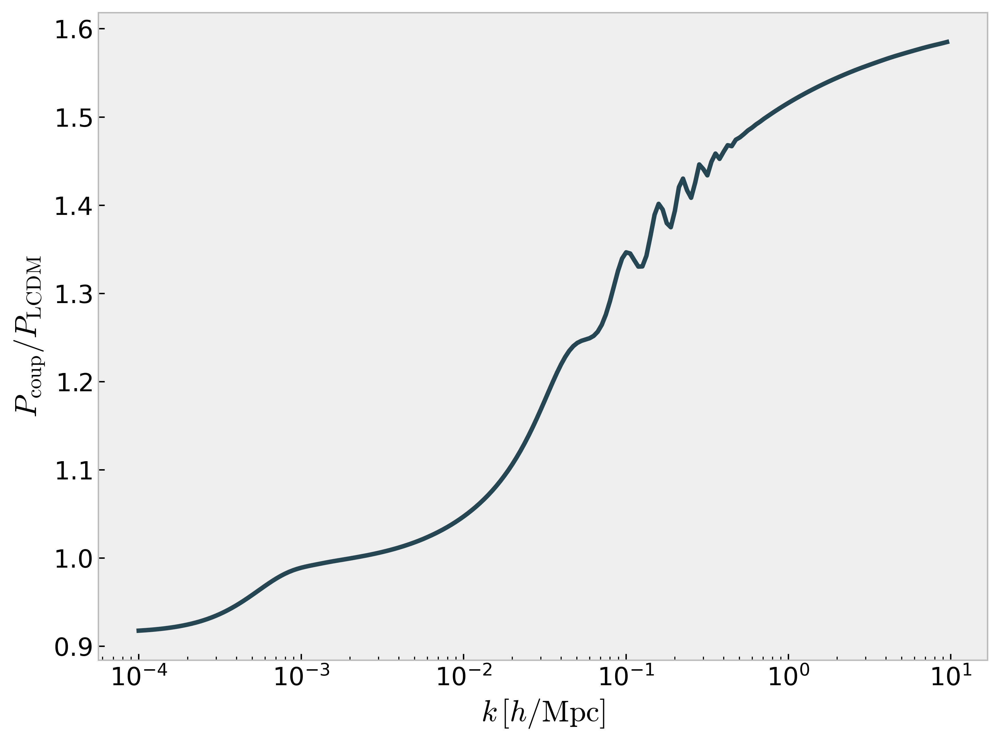

In [8]:
# k in h/Mpc, convert to 1/Mpc for CLASS
k_max = common['P_k_max_h/Mpc'] * 0.95
k = np.logspace(-4, np.log10(k_max), 200)
h = common['h']

pk_lcdm = np.array([lcdm.pk(ki*h, 0.0) * h**3 for ki in k])
pk_coup = np.array([coup.pk(ki*h, 0.0) * h**3 for ki in k])
pk_conf = np.array([conf.pk(ki*h, 0.0) * h**3 for ki in k])

plt.figure(figsize=(8, 6))
plt.loglog(k, pk_lcdm, lw=lw, ls='-', label='LCDM')
plt.loglog(k, pk_coup, lw=lw, ls='--', label='Coupled')
plt.loglog(k, pk_conf, lw=lw, ls=':', label='Conformal')
plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$')
plt.ylabel(r'$P(k)\,[\mathrm{(Mpc}/h)^3]$')
plt.legend()
plt.tight_layout()

# Ratio
plt.figure(figsize=(8, 6))
plt.semilogx(k, pk_coup/pk_lcdm, lw=lw, ls='-')
plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$')
plt.ylabel(r'$P_{\rm coup}/P_{\rm LCDM}$')
plt.tight_layout()


<!-- ## 7) Perturbations (example) -->


pert type: <class 'dict'>
pert keys: ['scalar']


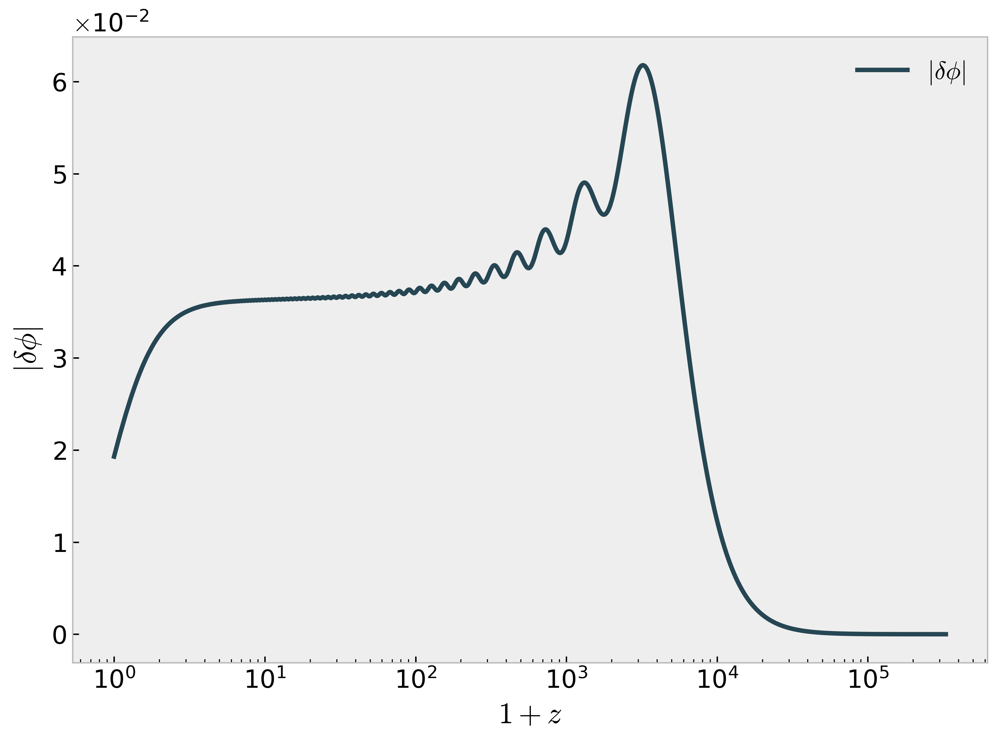

In [9]:
pert = coup.get_perturbations()

# inspect available keys
print('pert type:', type(pert))
if hasattr(pert, 'keys'):
    print('pert keys:', list(pert.keys()))

# pick the first k-mode in a robust way
p = None
if isinstance(pert, dict):
    if 'scalar' in pert:
        p = pert['scalar'][0]
    elif 'scalars' in pert:
        p = pert['scalars'][0]
elif isinstance(pert, list) and len(pert) > 0:
    p = pert[0]

if p is None:
    print('No scalar perturbations found. Set k_output_values to store perturbations.')
else:
    a = p['a']
    z = 1/a - 1

    plt.figure(figsize=(8, 6))
    if 'delta_phi_scf' in p:
        plt.semilogx(1+z, np.abs(p['delta_phi_scf']), lw=lw, label=r'$|\delta\phi|$')
        plt.xlabel(r'$1+z$')
        plt.ylabel(r'$|\delta\phi|$')
        plt.legend()
        plt.tight_layout()
    else:
        print('No delta_phi_scf field in perturbations output.')


<!-- ## 9) Disformal case (alpha=1, D0=1)

Same plots as above, but for the disformal coupling with `scf_alpha=1` and `scf_D0=1`. -->


[3.87968e+09 3.87968e+09 3.87968e+09 ... 3.87968e+09 3.87968e+09
 3.87968e+09]
[-1.06187950e-07 -1.06187950e-07 -1.06187950e-07 ... -1.04884548e-07
 -1.04881223e-07 -1.04877890e-07]


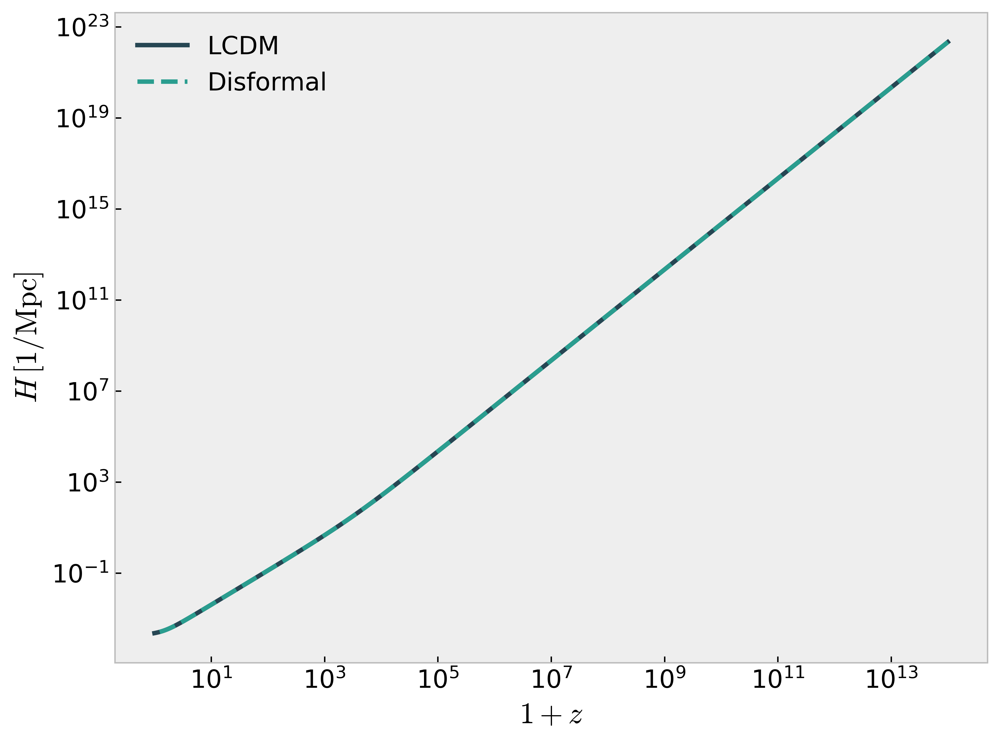

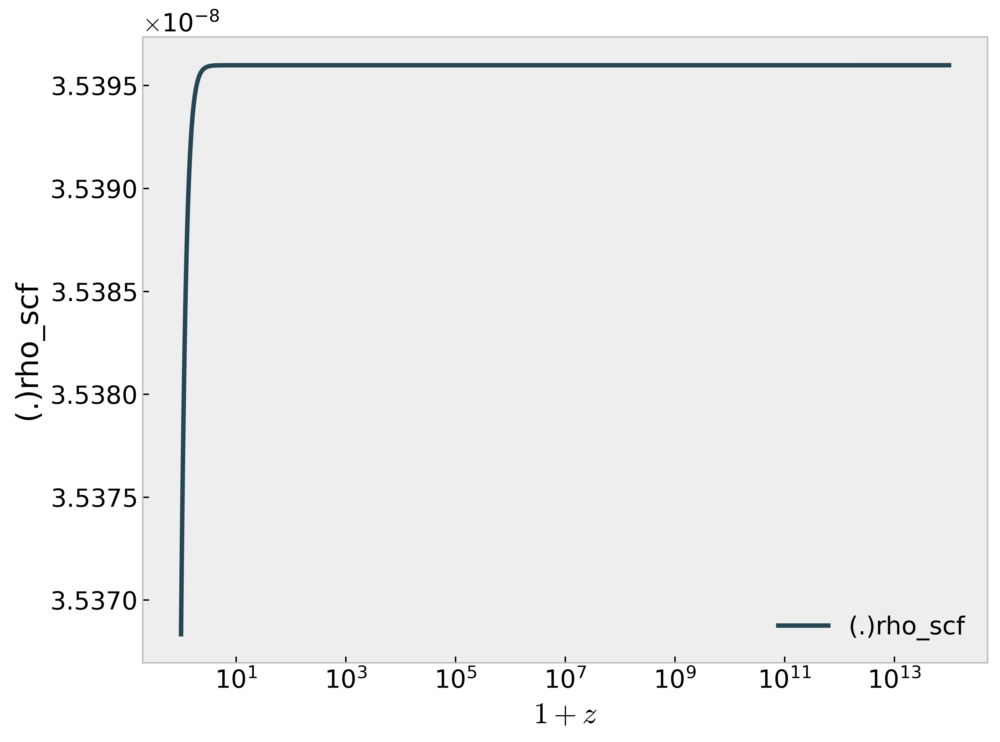

In [10]:
# Background evolution (LCDM vs disformal)
bg_disf = disf.get_background()
print(bg_disf['D_scf'])
print(bg_disf['Q_scf'])

z = bg_disf['z']

plt.figure(figsize=(8, 6))
plt.loglog(1+z, bg_lcdm['H [1/Mpc]'], lw=lw, ls='-', label='LCDM')
plt.loglog(1+z, bg_disf['H [1/Mpc]'], lw=lw, ls='--', label='Disformal')
plt.xlabel(r'$1+z$')
plt.ylabel(r'$H\,[1/\mathrm{Mpc}]$')
plt.legend()
plt.tight_layout()

plt.figure(figsize=(8, 6))
vals, label = get_bg_field(bg_disf, ['Omega_scf', '(.)Omega_scf', '(.)rho_scf'])
if vals is not None:
    plt.semilogx(1+z, vals, lw=lw, ls='-', label=label)
    plt.xlabel(r'$1+z$')
    plt.ylabel(label)
    plt.legend()
    plt.tight_layout()
else:
    print('No SCF background field found (keys may differ).')


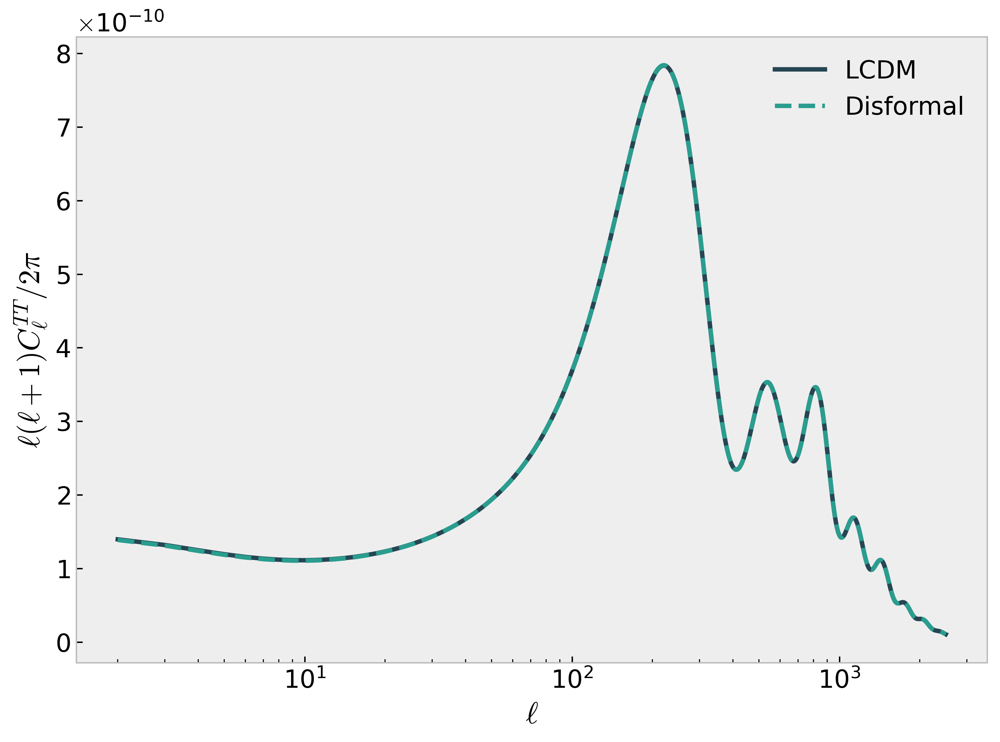

In [11]:
# CMB TT spectrum (LCDM vs disformal)
cls_disf = disf.lensed_cl(2500)

ell = cls_lcdm['ell'][2:]
cltt_disf = cls_disf['tt'][2:]

plt.figure(figsize=(8, 6))
plt.xscale('log')
plt.plot(ell, cltt_lcdm*ell*(ell+1)/(2*np.pi), lw=lw, ls='-', label='LCDM')
plt.plot(ell, cltt_disf*ell*(ell+1)/(2*np.pi), lw=lw, ls='--', label='Disformal')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell(\ell+1)C_\ell^{TT}/2\pi$')
plt.legend()
plt.tight_layout()


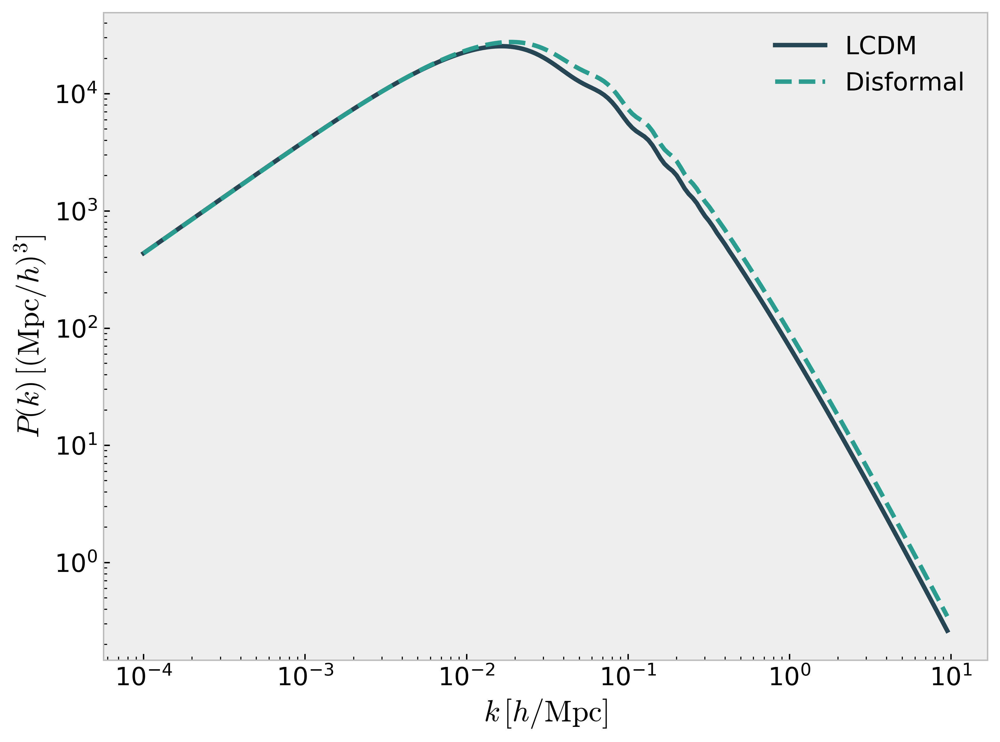

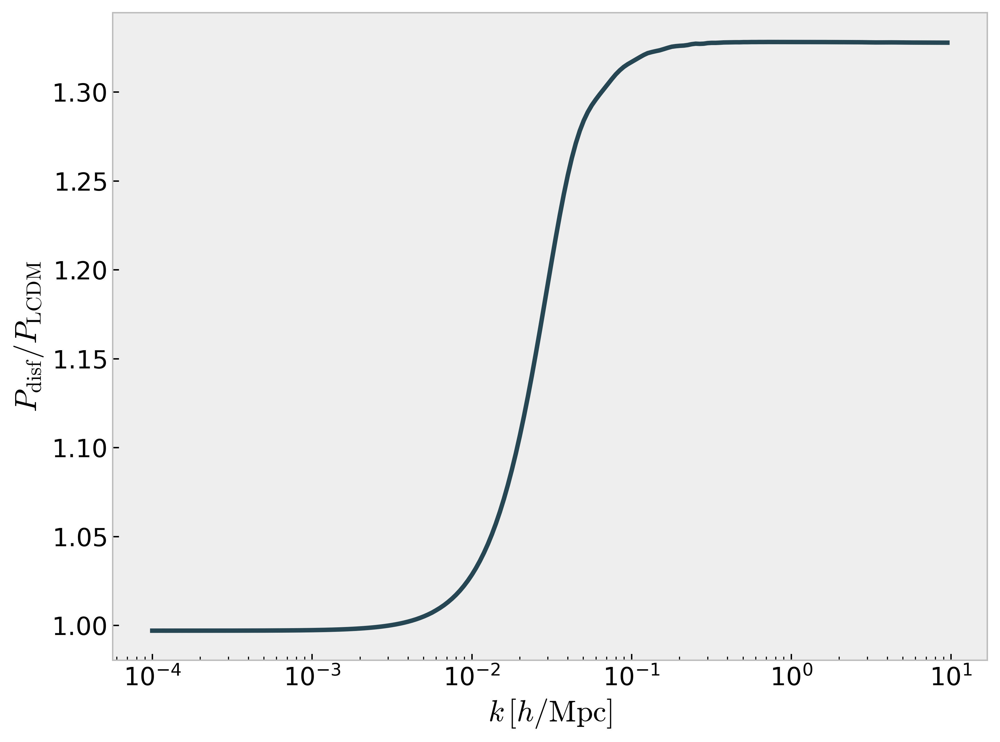

In [12]:
# Matter power spectrum (LCDM vs disformal)
# k in h/Mpc, convert to 1/Mpc for CLASS
k_max = common['P_k_max_h/Mpc'] * 0.95
k = np.logspace(-4, np.log10(k_max), 200)
h = common['h']

pk_disf = np.array([disf.pk(ki*h, 0.0) * h**3 for ki in k])

plt.figure(figsize=(8, 6))
plt.loglog(k, pk_lcdm, lw=lw, ls='-', label='LCDM')
plt.loglog(k, pk_disf, lw=lw, ls='--', label='Disformal')
plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$')
plt.ylabel(r'$P(k)\,[\mathrm{(Mpc}/h)^3]$')
plt.legend()
plt.tight_layout()

# Ratio
plt.figure(figsize=(8, 6))
plt.semilogx(k, pk_disf/pk_lcdm, lw=lw, ls='-')
plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$')
plt.ylabel(r'$P_{\rm disf}/P_{\rm LCDM}$')
plt.tight_layout()


pert_disf type: <class 'dict'>
pert_disf keys: ['scalar']


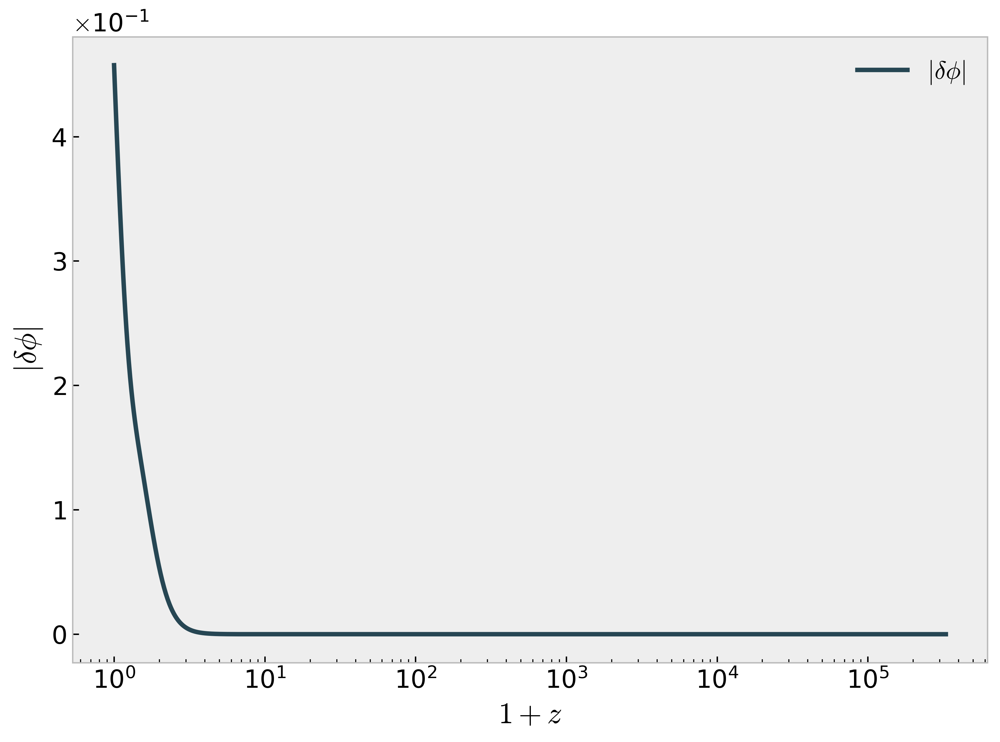

In [13]:
pert_disf = disf.get_perturbations()

print('pert_disf type:', type(pert_disf))
if hasattr(pert_disf, 'keys'):
    print('pert_disf keys:', list(pert_disf.keys()))

p = None
if isinstance(pert_disf, dict):
    if 'scalar' in pert_disf:
        p = pert_disf['scalar'][0]
    elif 'scalars' in pert_disf:
        p = pert_disf['scalars'][0]
elif isinstance(pert_disf, list) and len(pert_disf) > 0:
    p = pert_disf[0]

if p is None:
    print('No scalar perturbations found. Set k_output_values to store perturbations.')
else:
    a = p['a']
    z = 1/a - 1

    plt.figure(figsize=(8, 6))
    if 'delta_phi_scf' in p:
        plt.semilogx(1+z, np.abs(p['delta_phi_scf']), lw=lw, label=r'$|\delta\phi|$')
        plt.xlabel(r'$1+z$')
        plt.ylabel(r'$|\delta\phi|$')
        plt.legend()
        plt.tight_layout()
    else:
        print('No delta_phi_scf field in perturbations output.')


## Effective phantom dark-energy equation of state

For the coupled models, define an effective dark-energy density by putting into the DE sector the part of the coupled dark matter that does **not** dilute like standard CDM:

$\rho_{\rm DE,eff}(z) = \rho_\phi(z) + \rho_{\rm idm}(z) - \rho_{\rm idm,0}(1+z)^3$.

Since the coupled dark matter is pressureless, $p_{\rm DE,eff}=p_\phi$, and therefore $w_{\rm DE,eff}=p_\phi/\rho_{\rm DE,eff}$. This reconstructed quantity can cross below $-1$ even though the scalar field itself is canonical.



conformal ($\lambda=0.8,\,\beta=0.05$): min w_DE,eff = -1.1455, max w_DE,eff = -0.9179, DM-excess fraction today = 0.000e+00, DM column = (.)rho_qcdm
disformal ($D_0=1$): min w_DE,eff = -1.7003, max w_DE,eff = -0.9987, DM-excess fraction today = 0.000e+00, DM column = (.)rho_qcdm


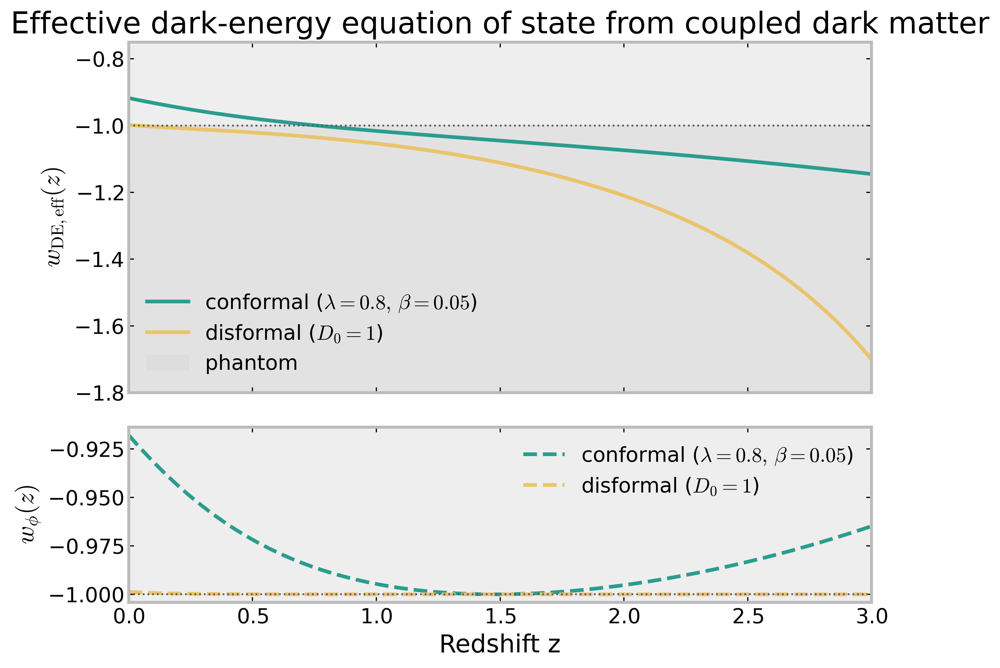

In [30]:
import os

# Effective phantom dark-energy equation of state from coupled DM
# This uses separate demonstration parameters so the previous conf/disf examples are unchanged.

conformal_phantom_params = dict(conformal_params)
conformal_phantom_params.update({
    'scf_lambda': 0.8,
    'scf_beta': 0.05,
    'scf_C0': 1.0,
})

disformal_phantom_params = dict(disformal_params)
disformal_phantom_params.update({
    'scf_lambda': 1.0,
    'scf_alpha': 0.0,
    'scf_D0': 1.0,
})

# Avoid keeping stale CLASS objects if the cell is rerun.
for _name in ['conf_phantom', 'disf_phantom']:
    if _name in globals():
        try:
            globals()[_name].struct_cleanup()
            globals()[_name].empty()
        except Exception:
            pass

conf_phantom = run_class(conformal_phantom_params)
disf_phantom = run_class(disformal_phantom_params)


def _background_sorted(model):
    bg = model.get_background()
    if 'z' in bg:
        z = np.asarray(bg['z'])
    elif '(.)a' in bg:
        z = 1.0 / np.asarray(bg['(.)a']) - 1.0
    elif 'a' in bg:
        z = 1.0 / np.asarray(bg['a']) - 1.0
    else:
        raise KeyError('No z or scale factor in background output.')

    order = np.argsort(z)
    return bg, z[order], order


def _coupled_dm_density(bg):
    for key in ['(.)rho_qcdm', '(.)rho_idm', '(.)rho_cdm']:
        if key in bg:
            return np.asarray(bg[key]), key
    raise KeyError('No coupled-DM density column found in background output.')


def effective_de_eos(model):
    bg, z, order = _background_sorted(model)
    rho_phi = np.asarray(bg['(.)rho_scf'])[order]
    p_phi = np.asarray(bg['(.)p_scf'])[order]
    rho_dm_raw, dm_key = _coupled_dm_density(bg)
    rho_dm = rho_dm_raw[order]

    # Standard pressureless dilution matched to the coupled-DM density today.
    rho_dm0 = np.interp(0.0, z, rho_dm)
    rho_dm_a3 = rho_dm0 * (1.0 + z)**3
    rho_dm_excess = rho_dm - rho_dm_a3

    rho_de_eff = rho_phi + rho_dm_excess
    p_de_eff = p_phi

    with np.errstate(divide='ignore', invalid='ignore'):
        w_phi = p_phi / rho_phi
        w_de_eff = p_de_eff / rho_de_eff
        frac_dm_excess = rho_dm_excess / rho_de_eff

    return {
        'z': z,
        'w_phi': w_phi,
        'w_de_eff': w_de_eff,
        'rho_de_eff': rho_de_eff,
        'rho_dm_excess': rho_dm_excess,
        'frac_dm_excess': frac_dm_excess,
        'dm_key': dm_key,
    }


examples = {
    r'conformal ($\lambda=0.8,\,\beta=0.05$)': effective_de_eos(conf_phantom),
    r'disformal ($D_0=1$)': effective_de_eos(disf_phantom),
}

z_plot = np.linspace(0.0, 3.0, 300)
colors_eff = {
    'conformal': '#2a9d8f',
    'disformal': '#e9c46a',
}

fig, (ax_eff, ax_phi) = plt.subplots(
    2, 1, figsize=(8.5, 6.5), sharex=True,
    gridspec_kw={'height_ratios': [2.0, 1.0]}
)

for label, data in examples.items():
    z = data['z']
    color = colors_eff['conformal'] if 'conformal' in label else colors_eff['disformal']
    w_eff = np.interp(z_plot, z, data['w_de_eff'])
    w_phi = np.interp(z_plot, z, data['w_phi'])
    frac_extra = np.interp(z_plot, z, data['frac_dm_excess'])

    ax_eff.plot(z_plot, w_eff, lw=lw, color=color, label=label)
    ax_phi.plot(z_plot, w_phi, lw=lw, ls='--', color=color, label=label)

    finite = np.isfinite(w_eff)
    print(
        f"{label}: min w_DE,eff = {np.nanmin(w_eff[finite]):.4f}, "
        f"max w_DE,eff = {np.nanmax(w_eff[finite]):.4f}, "
        f"DM-excess fraction today = {frac_extra[0]:.3e}, "
        f"DM column = {data['dm_key']}"
    )

ax_eff.axhline(-1.0, color='0.35', lw=1.2, ls=':')
ax_eff.fill_between(z_plot, -1.8, -1.0, color='0.85', alpha=0.55, label='phantom')
ax_eff.set_ylim(-1.8, -0.75)
ax_eff.set_ylabel(r'$w_{\rm DE,eff}(z)$')
ax_eff.set_title('Effective dark-energy equation of state from coupled dark matter')
ax_eff.legend(frameon=False, loc='best')

ax_phi.axhline(-1.0, color='0.35', lw=1.2, ls=':')
ax_phi.set_ylabel(r'$w_\phi(z)$')
ax_phi.set_xlabel('Redshift z')
ax_phi.legend(frameon=False, loc='best')

for ax in (ax_eff, ax_phi):
    ax.set_xlim(0.0, 3.0)
    ax.tick_params(axis='both', which='both', direction='in', top=True, right=True)

plt.tight_layout()
os.makedirs('notebooks/figures', exist_ok=True)
plt.savefig('notebooks/figures/effective_phantom_eos_conformal_disformal.png', dpi=180, bbox_inches='tight')
plt.show()






<!-- ## 8) Type-3 Reproduction (Figs. 9 and 10 in arXiv:1307.0458)

Using the paper's Type-3 setup from the arXiv source (`paper_coupled_types.tex`):
- coupling: `gamma_0 = 0.15` (compared to uncoupled `gamma_0 = 0`)
- potential: 1EXP with `lambda = 1.22`
- quintessence ICs: `phi_i = 1e-4`, `phi_prime_i = 0`

Plots are generated with this notebook's style, but with the paper parameter choices. -->

In [14]:
import os
import numpy as np

# Type-3 baseline used for plotting

k_scale=[0.0001*0.67556,0.1*0.67556,0.125*0.67556,0.01*0.67556,1*0.67556,0.2*0.67556,2*0.67556]
# k_scale = np.logspace(-3.9, 1, 100)
# print(k_scale)
# k_scale=[3*1e-5*0.67556,0.02*0.67556,0.2*0.67556,2*0.67556]
k_sorted = np.sort(k_scale)
output_k=''
for i in k_sorted:
    output_k+=str(i)+','
output_k = output_k[:-1]
print(output_k)

common_type3 = {
    'output':'tCl,pCl,dCl,lCl,mPk,mTk',
    'lensing':'yes',
    'l_max_scalars': 3000,
    # 'l_switch_limber_for_nc_local_over_z':1000, 
    # 'l_switch_limber_for_nc_los_over_z':1000,
    # 'start_small_k_at_tau_c_over_tau_h': 1e-5, 
    # 'start_large_k_at_tau_h_over_tau_k': 1e-5,
    'omega_b': 0.022032,
    'h': 0.673,
    'N_ncdm': 1,
    'N_ur': 2.0328,
    'm_ncdm': 0.06,
    'T_ncdm': 0.71611,
    'tau_reio': 5.564022e-02,
    'YHe': 2.478407e-01,
    'A_s': 2.215e-9,
    'n_s': 0.9619,
    'P_k_max_h/Mpc': 10.0,
    'z_pk': 0,
    'evolver': 0,
    'gauge': 'synchronous',
    'k_output_values': output_k,
    'write background': 'yes',
    'z_max_pk': 1000.0,
    'l_switch_limber_for_nc_local_over_z': 1000,
    'l_switch_limber_for_nc_los_over_z': 1000,
    'start_small_k_at_tau_c_over_tau_h': 1e-5,
    # Older class_IDE starts the background later than darkin-class; 0.004 is the
    # smallest safe value for the matched large-k scan on this build.
    'start_large_k_at_tau_h_over_tau_k': 0.004,
    'format': 'class',
}


def run_class_type3(params):
    cosmo = Class()
    cosmo.set(params)
    cosmo.compute()
    return cosmo


def run_class_type3_safe(params):
    try:
        return run_class_type3(params), None
    except Exception as e:
        msg = str(e)

        # Early-time boundary issue around z_max / a_ini
        if (('out of range' in msg and 'z_max' in msg) or
            ('a_ini_over_a_today_default' in msg and 'z_initial' in msg)):
            p2 = dict(params)
            p2.pop('a_ini_over_a_today_default', None)
            try:
                return run_class_type3(p2), None
            except Exception as e2:
                return None, e2

        # Compatibility fallback if parser expects legacy name
        if 'did not read input parameter(s): scf_gamma0' in msg:
            p2 = dict(params)
            if 'scf_gamma0' in p2:
                p2['scf_gamma'] = p2.pop('scf_gamma0')
            try:
                return run_class_type3(p2), None
            except Exception as e2:
                return None, e2

        return None, e


def type3_params(gamma0, mode='paper2603'):
    # mode='paper2603': target Fig. 2 setup from arXiv:2603.15805
    # (momentum-only Q=0, lambda=0.5, m_nu=0.06 eV).
    p = dict(common_type3)

    p.update({
        'Omega_scf': -1,
        'Omega_Lambda': 0.0,
        'Omega_fld': 0.0,
        'scf_potential': 'exp',
        'scf_coupling_type': 'momentum',
        'attractor_ic_scf': 'no',
        'scf_phi_ini': 1e-4,
        'scf_phi_prime_ini': 0.0,
        'scf_V0': 0.0,
        'scf_shooting_target': 'scf_V0',
        'scf_gamma0': gamma0,
        'gauge':'synchronous',
        'get_perturbations_in_current_gauge':'yes',
        'matter_source_in_current_gauge':'yes',
    })

    if mode == 'paper2603':
        p.update({
            'scf_lambda': 0.5,
            'omega_cdm': 1e-20,
            'omega_qcdm': 0.12038,
        })
    elif mode == 'class_IDE_like':
        p.update({
            'scf_lambda': 1.2247,
            'omega_cdm': 1e-20,
            'omega_qcdm': 0.12038,
        })
    elif mode == 'paper1604':
        p.update({
            'scf_lambda': 1.2247,
            'omega_cdm': 1e-20,
            'omega_qcdm': 0.12038,
        })
    else:
        p.update({
            'scf_lambda': 0.5,
            'omega_cdm': 1e-20,
            'omega_qcdm': 0.12038,
        })

    return p


def lcdm_type3_params(mode='paper2603'):
    """True LCDM fiducial for the Type-3 comparison.

    This keeps the same baseline cosmological settings and neutrino sector as the
    momentum runs, but puts the dark matter in standard CDM and removes the SCF
    sector entirely. This is the fiducial used in the paper-style P(k) ratios.
    """
    p = dict(common_type3)

    # Remove scalar-field and coupled-IDM settings inherited from common/update paths.
    for key in [
        'Omega_scf', 'Omega_Lambda', 'Omega_fld',
        'scf_potential', 'scf_coupling_type', 'attractor_ic_scf',
        'scf_phi_ini', 'scf_phi_prime_ini', 'scf_V0', 'scf_lambda',
        'scf_shooting_target', 'scf_gamma0', 'scf_gamma',
        'scf_log10minus_gamma0', 'omega_qcdm', 'Omega_qcdm',
        'idm_soundspeed', 'cross_idm_b', 'u_idm_g', 'a_idm_dr',
    ]:
        p.pop(key, None)

    p['omega_cdm'] = 0.12038
    p['gauge'] = 'synchronous'
    return p


# Default benchmark mode
# TYPE3_MODE = 'paper2603'

# if TYPE3_MODE == 'paper2603':
#     # Paper uses beta = 0.1, 1, 10, 100 with Q=0.
#     # In this implementation the matching scan is gamma0 = -beta.
#     type3_gammas = [0.0, -0.1, -1.0, -10.0, -100.0]
# elif TYPE3_MODE == 'class_IDE_like':
#     type3_gammas = [0.0, -0.1, -0.8, -1.0]
# else:
#     type3_gammas = [0.0, -0.1, -1.0, -10.0, -100.0]


# type3_labels = {
#     0.0: r'Fiducial ($\beta=0, Q=0$)',
#     -0.1: r'Q=0 ($\beta=0.1$)',
#     -0.8: r'class_IDE-like ($\gamma_0=-0.8$)',
#     -1.0: r'Q=0 ($\beta=1$)',
#     -10.0: r'Q=0 ($\beta=10$)',
#     -100.0: r'Q=0 ($\beta=100$)',
# }

TYPE3_MODE = 'paper1604'

# type3_gammas = [0.0, 0.01, 0.05, 0.1, 0.2, 0.23]
# type3_gammas = [0.0, -0.1, -0.5, -1.0, -5.0, -10.0, -100.0,-10000]
type3_gammas = [0.0, -1e-2, -1e-1, -1.0, -1e1, -1e2, -1e3, -1e4, -1e5, -1e6]
# type3_gammas = [0.0, 0.1,-0.8,-1.2]

type3_labels = {
    0.0: r'$\beta=0$ scalar',
    -0.01: r'$\gamma_0=-0.01$',
    -0.05: r'$\gamma_0=-0.05$',
    -0.1: r'$\gamma_0=-0.1$',
    -0.2: r'$\gamma_0=-0.2$',
    -0.4: r'$\gamma_0=-0.4$',
    -1.0: r'$\gamma_0=-1.0$',
}


type3_styles = {
    0.0: {'ls': '-', 'lw': lw},
    -0.01: {'ls': '--', 'lw': lw},
    -0.05: {'ls': '-.', 'lw': lw},
    -0.1: {'ls': ':', 'lw': lw},
    -0.2: {'ls': '--', 'lw': lw},
    -0.4: {'ls': ':', 'lw': lw},
    -1.0: {'ls': '-.', 'lw': lw},
}


type3_models = {}
type3_failures = {}

for g in type3_gammas:
    print("\n" + "="*80)
    print("About to run gamma0 =", g)

    params_g = type3_params(g, mode=TYPE3_MODE)

    # Important: force the scan value last, after all updates/fallbacks
    params_g['scf_gamma0'] = g
    params_g.pop('scf_gamma', None)
    params_g.pop('scf_log10minus_gamma0', None)

    model, err = run_class_type3_safe(params_g)

    if model is None:
        type3_failures[g] = err
        print("FAILED:", err)
        continue

    type3_models[g] = model

    bg = model.get_background()

    # print("RUN gamma0 =", g)
    # print("  h =", model.h())
    # print("  ddgamma first,last =", bg['ddgamma_scf'][0], bg['ddgamma_scf'][-1])
    # print("  scf_mom first,last =", bg['scf_mom'][0], bg['scf_mom'][-1])

    # for kk in [1e-3, 1e-2, 1e-1]:
    #     pk_val = model.pk(kk * model.h(), 0.0) * model.h()**3
    #     print("  pk", kk, pk_val)

lcdm_type3, lcdm_type3_err = run_class_type3_safe(lcdm_type3_params(mode=TYPE3_MODE))
if lcdm_type3 is None:
    raise RuntimeError(f'LCDM fiducial failed: {lcdm_type3_err}')

# Keep the gamma0=0 scalar run for diagnostics, but use true LCDM as fiducial.
type3_unc = type3_models.get(0.0)
type3_fid = lcdm_type3
type3_fid_label = r'LCDM fiducial'
type3_fid_style = {'ls': '-', 'lw': lw, 'color': 'k'}

if type3_failures:
    print('Warning: some Type-3 points failed and will be skipped:')
    for g, err in type3_failures.items():
        print(f'  gamma0={g}: {err}')

type3_gammas_plot = [g for g in type3_gammas if g in type3_models]

out_dir = os.path.join('notebooks', 'figures')
os.makedirs(out_dir, exist_ok=True)



6.7556e-05,0.0067556000000000005,0.067556,0.084445,0.135112,0.67556,1.35112

About to run gamma0 = 0.0
MOMTERM gamma0=0.000000e+00 a=9.503839e-04 z=1.051206e+03 k=2.060324e-02 dy0=0.000000e+00 term1_drho=-0.000000e+00 term2_flux=0.000000e+00 term3_drag=-0.000000e+00 total=0.000000e+00 ratio=0.000000e+00 A1=1.000000e+00 A2=0.000000e+00 B1=0.000000e+00 B2=0.000000e+00 B3=0.000000e+00 theta=0.000000e+00 Z=-8.052840e-09 gZ=-0.000000e+00 gZZ=0.000000e+00 dphi=-2.650610e-10 dphip=-4.184568e-12 drho_num=1.322784e-17
MOMTERM gamma0=0.000000e+00 a=9.532282e-03 z=1.039067e+02 k=2.060324e-02 dy0=0.000000e+00 term1_drho=-0.000000e+00 term2_flux=0.000000e+00 term3_drag=-0.000000e+00 total=0.000000e+00 ratio=0.000000e+00 A1=1.000000e+00 A2=0.000000e+00 B1=0.000000e+00 B2=0.000000e+00 B3=0.000000e+00 theta=0.000000e+00 Z=-2.957039e-07 gZ=-0.000000e+00 gZZ=0.000000e+00 dphi=-3.658287e-07 dphip=-1.457760e-09 drho_num=2.197141e-14
MOMTERM gamma0=0.000000e+00 a=9.503450e-02 z=9.522495e+00 k=2.060324e-02 

In [15]:
# import numpy as np
# import pandas as pd

# def bg_table_for_model(model, g, z_targets=(1000, 100, 10, 1, 0)):
#     bg = model.get_background()

#     if 'z' in bg:
#         z_arr = np.asarray(bg['z'])
#     elif '(.)a' in bg:
#         z_arr = 1.0 / np.asarray(bg['(.)a']) - 1.0
#     elif 'a' in bg:
#         z_arr = 1.0 / np.asarray(bg['a']) - 1.0
#     else:
#         raise KeyError("No z or a found in background.")

#     rows = []
#     for zz in z_targets:
#         i = np.argmin(np.abs(z_arr - zz))

#         rho_qcdm = bg['(.)rho_qcdm'][i]
#         rho_scf = bg['(.)rho_scf'][i]
#         rho_crit = bg['(.)rho_crit'][i]
#         p_scf = bg['(.)p_scf'][i]

#         Z = bg['scf_mom'][i]
#         gamma = bg['gamma_scf'][i]
#         gZ = bg['dgamma_scf'][i]
#         gZZ = bg['ddgamma_scf'][i]

#         rows.append({
#             'gamma0_input': g,
#             'z_target': zz,
#             'z_actual': z_arr[i],
#             'Omega_qcdm': rho_qcdm / rho_crit,
#             'Omega_scf': rho_scf / rho_crit,
#             'w_scf': p_scf / rho_scf,
#             'Z=scf_mom': Z,
#             'gamma': gamma,
#             'gamma_Z': gZ,
#             'gamma_ZZ': gZZ,
#             '1-gamma_ZZ': 1.0 - gZZ,
#             'gamma/rho_qcdm': gamma / rho_qcdm,
#             'Z gamma_Z/(3 rho_qcdm)': Z * gZ / (3.0 * rho_qcdm),
#         })

#     return rows

# rows = []
# for g, model in type3_models.items():
#     rows.extend(bg_table_for_model(model, g))

# df_bg = pd.DataFrame(rows)
# display(df_bg)

In [16]:
# def coeffs_quadratic_gamma(gamma0, Z=1.0, rho_qcdm=1.0, a=1.0, Hconf=1.0, Vphi=0.0):
#     gZ = 2.0 * gamma0 * Z
#     gZZ = 2.0 * gamma0

#     A1 = (Z - gZ) / (Z * (1.0 - gZZ))

#     A2 = (
#         (3.0 / a) * Hconf * (Z * A1 * gZZ - gZ)
#         - (gZ + Z * gZZ) * Vphi / (Z * (1.0 - gZZ))
#     )

#     den_euler = 1.0 - Z * gZ / (3.0 * rho_qcdm)

#     B1 = (gZ * A1 / (Z - gZ)) / den_euler
#     B2 = -A2 / (a * Z * den_euler)
#     B3 = (
#         (1.0 / a**2) * (3.0 * Hconf * Z * gZ * A1 - a * A2 * (gZ - Z))
#         / (3.0 * rho_qcdm - Z * gZ)
#     )

#     return A1, B1, B2, B3

# for g in [0.0, -0.01, -0.1, -1, -10, -100, -1e5, 0.1, 0.2, 0.4]:
#     if g == 0.5:
#         continue
#     try:
#         A1, B1, B2, B3 = coeffs_quadratic_gamma(g)
#         print(f"gamma0={g: .3e}  A1={A1: .6e}  B1={B1: .6e}  B2={B2: .6e}  B3={B3: .6e}")
#     except Exception as e:
#         print("failed", g, e)

In [17]:
# model = type3_models[0.1]  # or whichever exists
# tr = model.get_transfer(z=0)

# print(tr.keys())

In [18]:
# def plot_transfer_ratio(g, key):
#     tr0 = type3_models[0.0].get_transfer(z=0)
#     trg = type3_models[g].get_transfer(z=0)

#     k0 = tr0['k (h/Mpc)'] if 'k (h/Mpc)' in tr0 else tr0['k']
#     kg = trg['k (h/Mpc)'] if 'k (h/Mpc)' in trg else trg['k']

#     plt.semilogx(kg, trg[key] / np.interp(kg, k0, tr0[key]), label=f'{key}, gamma0={g}')
#     plt.axhline(1, color='0.4', lw=1)
#     plt.legend()
#     plt.show()

# for key in ['d_idm', 't_idm', 'd_m', 'd_tot']:
#     if key in type3_models[0.0].get_transfer(z=0):
#         plot_transfer_ratio(0.1, key)

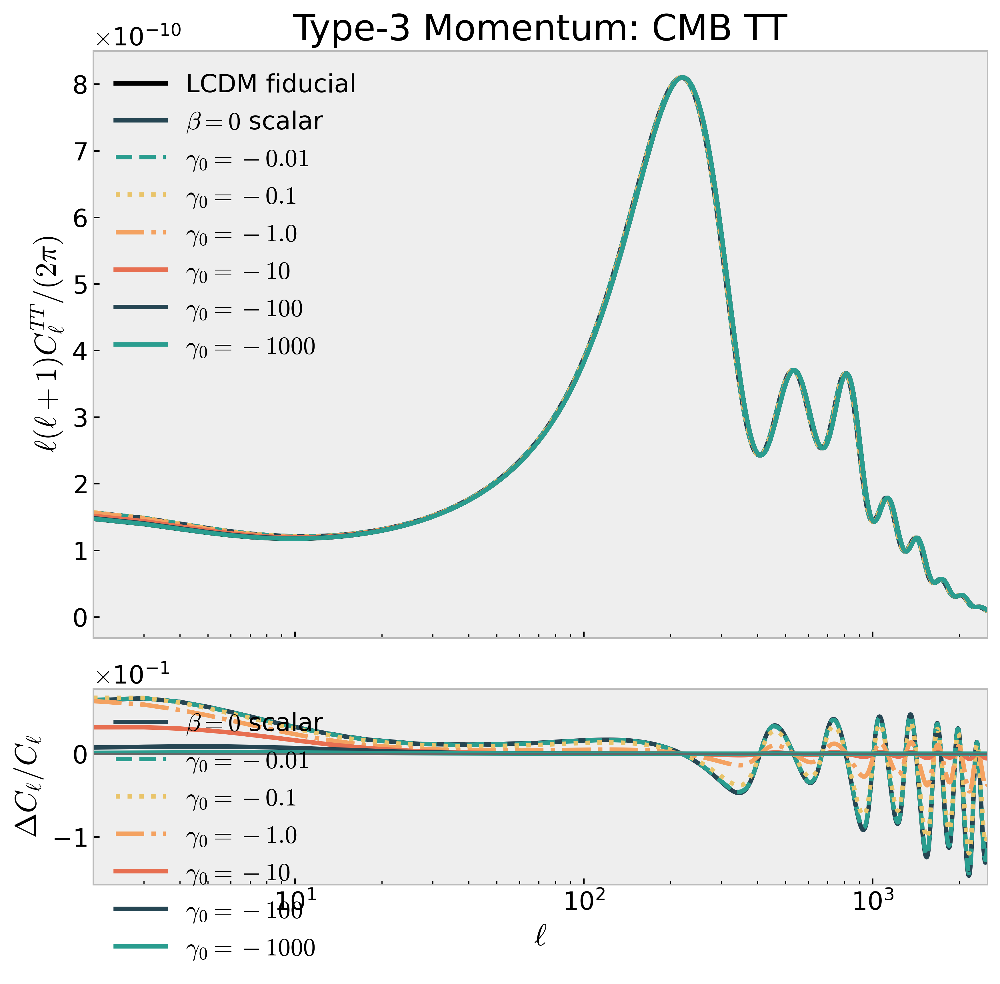

In [19]:
# Fig. 9 reproduction: CMB TT (top) + fractional difference (bottom)

cls_fid = type3_fid.raw_cl(2500)
ell = cls_fid['ell'][2:]
pref = ell * (ell + 1) / (2.0 * np.pi)
cltt_fid = cls_fid['tt'][2:] * pref

fig, axs = plt.subplots(
    2, 1, figsize=(8, 8), sharex=True,
    gridspec_kw={'height_ratios': [3, 1]}
)

axs[0].plot(ell, cltt_fid, label=type3_fid_label, **type3_fid_style)

for g in type3_gammas_plot:
    if g not in type3_models:
        continue

    cls = type3_models[g].raw_cl(2500)
    cltt = cls['tt'][2:] * pref

    label = type3_labels.get(g, rf'$\gamma_0={g:g}$')
    style = type3_styles.get(g, {'ls': '-', 'lw': lw})

    axs[0].plot(ell, cltt, label=label, **style)

    dcl = (cltt - cltt_fid) / cltt_fid
    axs[1].plot(ell, dcl, label=label, **style)

axs[0].set_xscale('log')
axs[0].set_xlim(2, 2500)
axs[0].set_ylabel(r'$\ell(\ell+1)C_\ell^{TT}/(2\pi)$')
axs[0].set_title('Type-3 Momentum: CMB TT')
axs[0].legend(frameon=False)

axs[1].axhline(0.0, color='0.4', lw=1.0)
axs[1].set_xscale('log')
axs[1].set_xlim(2, 2500)
axs[1].set_xlabel(r'$\ell$')
axs[1].set_ylabel(r'$\Delta C_\ell / C_\ell$')
axs[1].legend(frameon=False)

plt.tight_layout()
plt.savefig(os.path.join(out_dir, 'type3_fig9_repro_tt.png'), dpi=180)
plt.show()

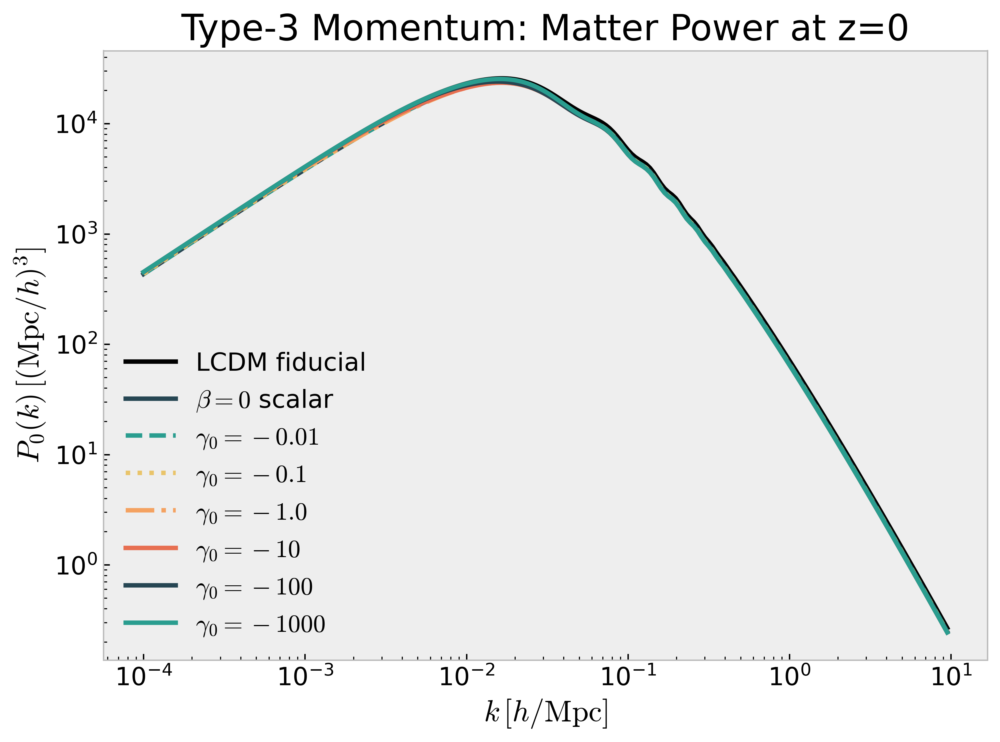

gamma0=0.0: min(P/P_LCDM)=0.929779, max(P/P_LCDM)=0.956631
gamma0=-0.01: min(P/P_LCDM)=0.928921, max(P/P_LCDM)=0.957619
gamma0=-0.1: min(P/P_LCDM)=0.923457, max(P/P_LCDM)=0.964823
gamma0=-1.0: min(P/P_LCDM)=0.913959, max(P/P_LCDM)=0.986914
gamma0=-10.0: min(P/P_LCDM)=0.912437, max(P/P_LCDM)=0.998182
gamma0=-100.0: min(P/P_LCDM)=0.912348, max(P/P_LCDM)=0.999795
gamma0=-1000.0: min(P/P_LCDM)=0.912309, max(P/P_LCDM)=0.999965


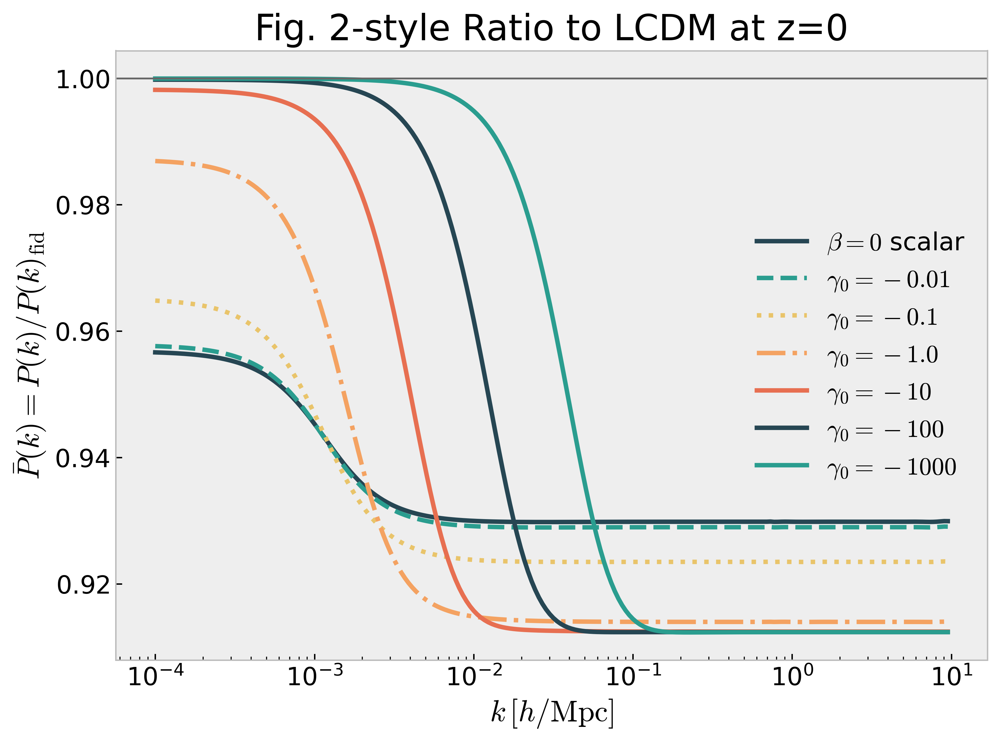

Saved: notebooks/figures/type3_fig9_repro_tt.png
Saved: notebooks/figures/type3_fig10_repro_pk.png
Saved: notebooks/figures/type3_fig10_repro_pk_ratio.png


In [20]:
# Fig. 10 reproduction: linear total matter power spectrum at z=0

# Robust k_max: your common_type3 uses P_k_max_h/Mpc, not P_k_max_1/Mpc
k_max = common_type3.get('P_k_max_h/Mpc', common_type3.get('P_k_max_1/Mpc', 10.0)) * 0.95
k = np.logspace(-4, np.log10(k_max), 220)

# Use the true LCDM fiducial, not the gamma0=0 scalar run
h_fid = type3_fid.h()

pk_fid = np.array([
    type3_fid.pk(ki * h_fid, 0.0) * h_fid**3
    for ki in k
])

pk_models = {}

# Absolute P(k)
plt.figure(figsize=(8, 6))
plt.loglog(k, pk_fid, label=type3_fid_label, **type3_fid_style)

for g in type3_gammas_plot:
    if g not in type3_models:
        continue

    model = type3_models[g]
    h = model.h()

    pk = np.array([
        model.pk(ki * h, 0.0) * h**3
        for ki in k
    ])

    pk_models[g] = pk

    label = type3_labels.get(g, rf'$\gamma_0={g:g}$')
    style = type3_styles.get(g, {'ls': '-', 'lw': lw})

    plt.loglog(k, pk, label=label, **style)

plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$')
plt.ylabel(r'$P_0(k)\,[\mathrm{(Mpc}/h)^3]$')
plt.title('Type-3 Momentum: Matter Power at z=0')
plt.legend(frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(out_dir, 'type3_fig10_repro_pk.png'), dpi=180)
plt.show()


# Ratio to LCDM fiducial
ratio_min, ratio_max = 1.0, 1.0

for g in type3_gammas_plot:
    if g not in pk_models:
        continue

    r = pk_models[g] / pk_fid
    ratio_min = min(ratio_min, float(np.nanmin(r)))
    ratio_max = max(ratio_max, float(np.nanmax(r)))

    print(
        f'gamma0={g}: '
        f'min(P/P_LCDM)={np.nanmin(r):.6f}, '
        f'max(P/P_LCDM)={np.nanmax(r):.6f}'
    )

plt.figure(figsize=(8, 6))

for g in type3_gammas_plot:
    if g not in pk_models:
        continue

    label = type3_labels.get(g, rf'$\gamma_0={g:g}$')
    style = type3_styles.get(g, {'ls': '-', 'lw': lw})

    plt.semilogx(k, pk_models[g] / pk_fid, label=label, **style)

plt.axhline(1.0, color='0.4', lw=1.0)
plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$')
plt.ylabel(r'$\bar{P}(k)=P(k)/P(k)_{\rm fid}$')
plt.title('Fig. 2-style Ratio to LCDM at z=0')

pad = max(0.002, 0.05 * (ratio_max - ratio_min))
plt.ylim(ratio_min - pad, ratio_max + pad)

plt.legend(frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(out_dir, 'type3_fig10_repro_pk_ratio.png'), dpi=180)
plt.show()

print('Saved:', os.path.join(out_dir, 'type3_fig9_repro_tt.png'))
print('Saved:', os.path.join(out_dir, 'type3_fig10_repro_pk.png'))
print('Saved:', os.path.join(out_dir, 'type3_fig10_repro_pk_ratio.png'))

## Illustrative Type-3 momentum matter-power figures

These plots use the same benchmark setup as the Type-3 momentum scan and show the matter-power response in two ways: relative to true $\Lambda$CDM, and relative to the $\gamma_0=0$ scalar-field run to isolate the momentum coupling itself.



In [ ]:
# Illustrative Type-3 momentum matter-power figures
# The script saves PNG/PDF figures and a small summary table in notebooks/figures/.

from pathlib import Path
import subprocess
import sys

try:
    from IPython.display import Image, display
except ImportError:
    Image = None
    display = None

cwd = Path.cwd()
script = cwd / 'notebooks' / 'momentum_pk_figures.py'
if not script.exists():
    script = cwd / 'momentum_pk_figures.py'

subprocess.run([
    sys.executable,
    str(script),
    '--gammas', '0,-0.1,-1,-10,-100',
], check=True)

figure_paths = [
    cwd / 'notebooks' / 'figures' / 'momentum_pk_effect_to_lcdm.png',
    cwd / 'notebooks' / 'figures' / 'momentum_pk_effect_to_scalar.png',
]
if not figure_paths[0].exists():
    figure_paths = [
        cwd / 'figures' / 'momentum_pk_effect_to_lcdm.png',
        cwd / 'figures' / 'momentum_pk_effect_to_scalar.png',
    ]

if display is not None:
    for figure_path in figure_paths:
        display(Image(filename=str(figure_path)))
else:
    print('\n'.join(str(path) for path in figure_paths))



## Small-scale momentum-coupling matter-power example

To avoid a purely large-scale amplitude effect, this example uses a steeper exponential potential, $\lambda=2$, and reruns each momentum-coupled model with $A_s$ adjusted so that the actual computed spectrum matches the $\gamma_0=0$ scalar reference at $k=10^{-3}\,h\,{\rm Mpc}^{-1}$. The plotted residual is therefore a shape change: the large-scale amplitude has been absorbed by an amplitude refit, while the small/intermediate-scale matter-power response remains.



In [ ]:
# Stronger illustrative momentum-coupling matter-power example
# Uses lambda=2 to amplify the isolated momentum-coupling signature.

from pathlib import Path
import subprocess
import sys

try:
    from IPython.display import Image, display
except ImportError:
    Image = None
    display = None

cwd = Path.cwd()
script = cwd / 'notebooks' / 'momentum_pk_figures.py'
if not script.exists():
    script = cwd / 'momentum_pk_figures.py'

subprocess.run([
    sys.executable,
    str(script),
    '--lambda-scf', '2',
    '--gammas', '0,-1,-10,-100,-1000,-10000',
    '--prefix', 'momentum_pk_strong_lambda2',
], check=True)

figure_paths = [
    cwd / 'notebooks' / 'figures' / 'momentum_pk_strong_lambda2_to_scalar.png',
    cwd / 'notebooks' / 'figures' / 'momentum_pk_strong_lambda2_to_lcdm.png',
]
if not figure_paths[0].exists():
    figure_paths = [
        cwd / 'figures' / 'momentum_pk_strong_lambda2_to_scalar.png',
        cwd / 'figures' / 'momentum_pk_strong_lambda2_to_lcdm.png',
    ]

if display is not None:
    for figure_path in figure_paths:
        display(Image(filename=str(figure_path)))
else:
    print('\n'.join(str(path) for path in figure_paths))



6.7556e-05


'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp


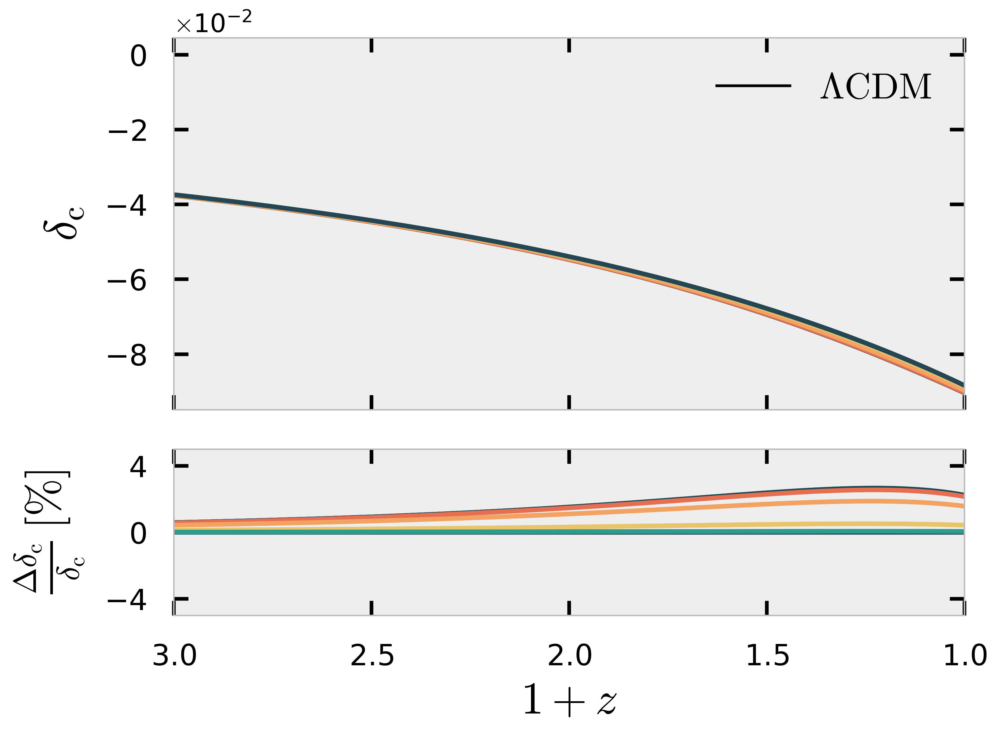

-9.034736124781731e-06


In [21]:
#print(k_sorted)
index_k_list = [0]
label = [r'$|\delta_{\rm c}| \times10^{-4}$','','','','']

lw = 2.5
ls = ['--','-','-.', ':', '-']
plt.style.use('bmh')
plt.style.use(['ipynb', 'use_mathtext','colors5-light'])

fig = plt.figure(figsize=(8,6))
ax0 = plt.subplot2grid((3,1),(0,0), rowspan=2)
ax1 = plt.subplot2grid((3,1),(2,0), rowspan=1,sharex = ax0)

plt.subplots_adjust(hspace=0,wspace=0.)

from scipy.interpolate import interp1d
import numpy as np
import matplotlib.pyplot as plt

def build_interp1d_monotonic(x, y, kind='linear', clamp=True):
    """interp1d with sorting and duplicate-x handling."""
    x = np.asarray(x); y = np.asarray(y)
    order = np.argsort(x)
    x = x[order]; y = y[order]
    xu, inv, cnt = np.unique(x, return_inverse=True, return_counts=True)
    if np.any(cnt > 1):
        yu = np.zeros_like(xu, dtype=float)
        np.add.at(yu, inv, y)
        yu /= cnt
    else:
        yu = y
    fill = (yu[0], yu[-1]) if clamp else 'extrapolate'
    return interp1d(xu, yu, kind=kind, bounds_error=False, fill_value=fill, assume_sorted=True)

# --- your plotting code (only the relevant bits changed) ---

index_k = 0  # you set this explicitly
print(k_sorted[index_k])

standardPerturb = type3_models[0].get_perturbations()
a0 = standardPerturb['scalar'][index_k]['a']                 # standard grid
z0 = 1/a0 - 1
delta_c0 = standardPerturb['scalar'][index_k]['delta_qcdm']

# interpolator: δ_c^Lc(a)
f_delta0_of_a = build_interp1d_monotonic(a0, delta_c0, kind='linear', clamp=True)

# plot the Lc baseline on its own grid (top panel)
ax0.plot(1+z0, delta_c0, c='k', ls='-', label=r'$\Lambda{\rm CDM}$', lw=1.5)

for g in type3_gammas_plot:  # your beta values
    cosmoPerturb = type3_models[g].get_perturbations()
    a = cosmoPerturb['scalar'][index_k]['a']                  # this run's grid
    z = 1/a - 1
    delta_c = cosmoPerturb['scalar'][index_k]['delta_qcdm']

    # interpolate standard onto THIS grid => shapes now match
    delta_c0_on_a = f_delta0_of_a(a)

    # top panel
    ax0.plot(1+z, delta_c, lw=lw)

    # bottom panel: percent difference, guard against tiny denominators
    eps = 1e-300
    denom = np.where(np.abs(delta_c0_on_a) > eps, delta_c0_on_a, np.nan)
    rel = 100.0 * (delta_c - delta_c0_on_a) / denom

    ax1.plot(1+z, rel, lw=lw)

    #ax0.plot(1+z, np.abs(cosmoPerturb['scalar'][index_k]['delta_rho_scf'])*1e-4, c='k', ls='-', label = r'$\delta {\phi}$',lw=1.5)

    # ax0.set_ylabel(type3_gammas[g], size=25)
    ax1.set_xlabel(r'$1+z$', size=25)
    #ax0.set_xlim(1e5,1)
    # ax0.set_ylim(1e-3,1)
    #ax0.set_title('k = '+str(k_sorted[index_k]), size=20)
    ax0.tick_params(axis='both', which='major', labelsize=16, width=1.1)
    for tick in ax0.xaxis.get_major_ticks():
        tick.set_pad(10)
    for tick in ax0.yaxis.get_major_ticks():
        tick.set_pad(10)    

#ax.ticklabel_format(axis='y', style='sci', scilimits=(0,0), useMathText=True) #---------------------------> Scientific format
#ax.yaxis.offsetText.set_fontsize(20) #---------------------------> size of the scientific format

#ax0.set_xscale('log');ax0.set_yscale('log')
ax1.set_xscale('linear');ax1.set_yscale('linear')

ax1.set_ylabel(r'$ \frac{\Delta \delta_{\rm c}}{\delta_{\rm c}}\, [\%]$', size=25,labelpad=10)
ax0.set_ylabel(r'$ \delta_{\rm c}$', size=25,labelpad=10)

# #ns-f0 plot and ns-h0 plot 
# #ax0.set_xlim([1.e-3,0.1])
# ax1.set_xlim(3,1)
# ax0.set_ylim(0.45,1.25)
# ax1.set_ylim(-2,12)
# ax1.set_yticks([i for i in np.linspace(0,10,3)])
# ax1.set_xticks([i for i in np.linspace(3,1,5)])

#h0 plot
#ax0.set_xlim([1.e-3,0.1])
ax1.set_xlim(3,1)
# ax0.set_ylim(0.45,1.5)
ax1.set_ylim(-5,5)
ax1.set_yticks([i for i in np.linspace(-4,4,3)])
ax1.set_xticks([i for i in np.linspace(3,1,5)])
    
ax0.tick_params(axis='both', which='both', labelsize=16)
ax0.tick_params(axis='both', which='both', labelsize=16)

#---------------------------------------------------------------------------------> change ticklabels distance
ax1.tick_params(axis='both', which='both', labelsize=16)
ax1.tick_params(axis='both', which='both', labelsize=16)

for tick in ax1.xaxis.get_major_ticks():
    tick.set_pad(15)
for tick in ax0.yaxis.get_major_ticks():
    tick.set_pad(15)
for tick in ax1.yaxis.get_major_ticks():
    tick.set_pad(15)
    
ax0.tick_params(axis='both', which='both', labelsize=16)

    
ax0.xaxis.set_tick_params(which='major', size=8, width=2, direction='in', top='on')
ax0.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in', top='on')
ax0.yaxis.set_tick_params(which='major', size=8, width=2, direction='in', right='on')
ax0.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in', right='on')

ax1.tick_params(axis='both', which='both', labelsize=16)

    
ax1.xaxis.set_tick_params(which='major', size=8, width=2, direction='in', top='on')
ax1.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in', top='on')
ax1.yaxis.set_tick_params(which='major', size=8, width=2, direction='in', right='on')
ax1.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in', right='on')

#ax0.set_xscale('log')
#ax0.set_yscale('log')
# original_labels = ax0.get_xticks()
# labels = []
# for label in original_labels:
#     labels.append(int(np.log10(label)))
# ax0.set_xticklabels(labels)

ax1.ticklabel_format(axis='y', style='plain', useMathText=True)


for ax in (ax0, ax1):
    # copy the list so we don't iterate over lines we add
    lines = list(ax.get_lines())[1:]
    for ln in lines[::-1]:
        ax.plot(
            ln.get_xdata(), ln.get_ydata(),
            ls=ln.get_linestyle(),
            lw=ln.get_linewidth(),
            c=ln.get_color(),
            marker=ln.get_marker(),
            markersize=ln.get_markersize(),
            alpha=ln.get_alpha() if ln.get_alpha() is not None else 1.0,
            label="_nolegend_",  # labels starting with '_' are ignored by legend()
        )

ax0.legend(loc='upper right', frameon=boolean, prop={'size': 20},ncol=2,columnspacing=1)
plt.setp(ax0.get_xticklabels(), visible=False)
plt.rcParams['font.size'] = 20
plt.rcParams['axes.linewidth'] = 2
fig.tight_layout()
fig.tight_layout()
plt.savefig('deltac_der_constant.pdf')
#, transparent=True)

plt.show()

print(cosmoPerturb['scalar'][index_k]['delta_qcdm'][-1]*1e-4)

6.7556e-05


'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp


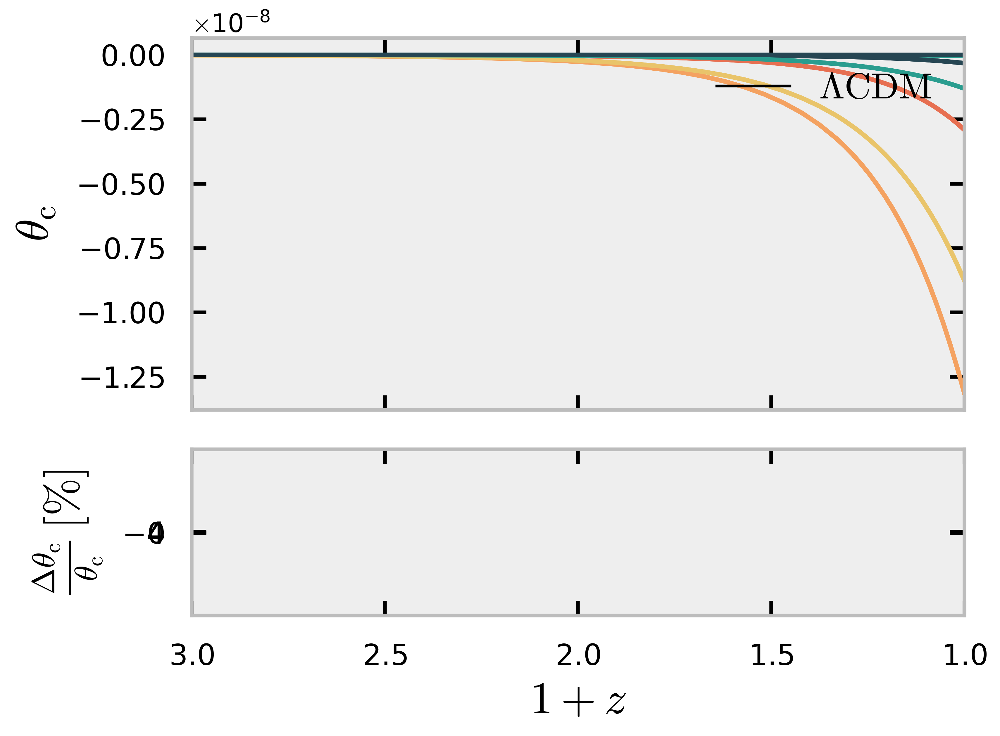

-3.283635960664846e-15


In [22]:
#print(k_sorted)
index_k_list = [0]
label = [r'$|\theta{\rm c}| \times10^{-4}$','','','','']

lw = 2.5
ls = ['--','-','-.', ':', '-']
plt.style.use('bmh')
plt.style.use(['ipynb', 'use_mathtext','colors5-light'])

fig = plt.figure(figsize=(8,6))
ax0 = plt.subplot2grid((3,1),(0,0), rowspan=2)
ax1 = plt.subplot2grid((3,1),(2,0), rowspan=1,sharex = ax0)

plt.subplots_adjust(hspace=0,wspace=0.)

from scipy.interpolate import interp1d
import numpy as np
import matplotlib.pyplot as plt

def build_interp1d_monotonic(x, y, kind='linear', clamp=True):
    """interp1d with sorting and duplicate-x handling."""
    x = np.asarray(x); y = np.asarray(y)
    order = np.argsort(x)
    x = x[order]; y = y[order]
    xu, inv, cnt = np.unique(x, return_inverse=True, return_counts=True)
    if np.any(cnt > 1):
        yu = np.zeros_like(xu, dtype=float)
        np.add.at(yu, inv, y)
        yu /= cnt
    else:
        yu = y
    fill = (yu[0], yu[-1]) if clamp else 'extrapolate'
    return interp1d(xu, yu, kind=kind, bounds_error=False, fill_value=fill, assume_sorted=True)

# --- your plotting code (only the relevant bits changed) ---

index_k = 0  # you set this explicitly
print(k_sorted[index_k])

standardPerturb = type3_models[0].get_perturbations()
a0 = standardPerturb['scalar'][index_k]['a']                 # standard grid
z0 = 1/a0 - 1
theta_c0 = standardPerturb['scalar'][index_k]['theta_qcdm']

# interpolator: δ_c^Lc(a)
f_theta0_of_a = build_interp1d_monotonic(a0, theta_c0, kind='linear', clamp=True)

# plot the Lc baseline on its own grid (top panel)
ax0.plot(1+z0, theta_c0, c='k', ls='-', label=r'$\Lambda{\rm CDM}$', lw=1.5)

for g in type3_gammas_plot:  # your beta values
    cosmoPerturb = type3_models[g].get_perturbations()
    a = cosmoPerturb['scalar'][index_k]['a']                  # this run's grid
    z = 1/a - 1
    theta_c = cosmoPerturb['scalar'][index_k]['theta_qcdm']

    # interpolate standard onto THIS grid => shapes now match
    theta_c0_on_a = f_theta0_of_a(a)

    # top panel
    ax0.plot(1+z, theta_c, lw=lw)

    # bottom panel: percent difference, guard against tiny denominators
    eps = 1e-300
    denom = np.where(np.abs(theta_c0_on_a) > eps, theta_c0_on_a, np.nan)
    rel = 100.0 * (theta_c - theta_c0_on_a) / denom

    ax1.plot(1+z, rel, lw=lw)

    #ax0.plot(1+z, np.abs(cosmoPerturb['scalar'][index_k]['delta_rho_scf'])*1e-4, c='k', ls='-', label = r'$\delta {\phi}$',lw=1.5)

    # ax0.set_ylabel(type3_gammas[g], size=25)
    ax1.set_xlabel(r'$1+z$', size=25)
    #ax0.set_xlim(1e5,1)
    # ax0.set_ylim(1e-3,1)
    #ax0.set_title('k = '+str(k_sorted[index_k]), size=20)
    ax0.tick_params(axis='both', which='major', labelsize=16, width=1.1)
    for tick in ax0.xaxis.get_major_ticks():
        tick.set_pad(10)
    for tick in ax0.yaxis.get_major_ticks():
        tick.set_pad(10)    

#ax.ticklabel_format(axis='y', style='sci', scilimits=(0,0), useMathText=True) #---------------------------> Scientific format
#ax.yaxis.offsetText.set_fontsize(20) #---------------------------> size of the scientific format

#ax0.set_xscale('log');ax0.set_yscale('log')
ax1.set_xscale('linear');ax1.set_yscale('linear')

ax1.set_ylabel(r'$ \frac{\Delta \theta_{\rm c}}{\theta_{\rm c}}\, [\%]$', size=25,labelpad=10)
ax0.set_ylabel(r'$ \theta_{\rm c}$', size=25,labelpad=10)

# #ns-f0 plot and ns-h0 plot 
# #ax0.set_xlim([1.e-3,0.1])
# ax1.set_xlim(3,1)
# ax0.set_ylim(0.45,1.25)
# ax1.set_ylim(-2,12)
# ax1.set_yticks([i for i in np.linspace(0,10,3)])
# ax1.set_xticks([i for i in np.linspace(3,1,5)])

#h0 plot
#ax0.set_xlim([1.e-3,0.1])
ax1.set_xlim(3,1)
# ax0.set_ylim(0.45,1.5)
ax1.set_ylim(-500,500)
ax1.set_yticks([i for i in np.linspace(-4,4,3)])
ax1.set_xticks([i for i in np.linspace(3,1,5)])
    
ax0.tick_params(axis='both', which='both', labelsize=16)
ax0.tick_params(axis='both', which='both', labelsize=16)

#---------------------------------------------------------------------------------> change ticklabels distance
ax1.tick_params(axis='both', which='both', labelsize=16)
ax1.tick_params(axis='both', which='both', labelsize=16)

for tick in ax1.xaxis.get_major_ticks():
    tick.set_pad(15)
for tick in ax0.yaxis.get_major_ticks():
    tick.set_pad(15)
for tick in ax1.yaxis.get_major_ticks():
    tick.set_pad(15)
    
ax0.tick_params(axis='both', which='both', labelsize=16)

    
ax0.xaxis.set_tick_params(which='major', size=8, width=2, direction='in', top='on')
ax0.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in', top='on')
ax0.yaxis.set_tick_params(which='major', size=8, width=2, direction='in', right='on')
ax0.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in', right='on')

ax1.tick_params(axis='both', which='both', labelsize=16)

    
ax1.xaxis.set_tick_params(which='major', size=8, width=2, direction='in', top='on')
ax1.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in', top='on')
ax1.yaxis.set_tick_params(which='major', size=8, width=2, direction='in', right='on')
ax1.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in', right='on')

#ax0.set_xscale('log')
#ax0.set_yscale('log')
# original_labels = ax0.get_xticks()
# labels = []
# for label in original_labels:
#     labels.append(int(np.log10(label)))
# ax0.set_xticklabels(labels)

ax1.ticklabel_format(axis='y', style='plain', useMathText=True)


for ax in (ax0, ax1):
    # copy the list so we don't iterate over lines we add
    lines = list(ax.get_lines())[1:]
    for ln in lines[::-1]:
        ax.plot(
            ln.get_xdata(), ln.get_ydata(),
            ls=ln.get_linestyle(),
            lw=ln.get_linewidth(),
            c=ln.get_color(),
            marker=ln.get_marker(),
            markersize=ln.get_markersize(),
            alpha=ln.get_alpha() if ln.get_alpha() is not None else 1.0,
            label="_nolegend_",  # labels starting with '_' are ignored by legend()
        )

ax0.legend(loc='upper right', frameon=boolean, prop={'size': 20},ncol=2,columnspacing=1)
plt.setp(ax0.get_xticklabels(), visible=False)
plt.rcParams['font.size'] = 20
plt.rcParams['axes.linewidth'] = 2
fig.tight_layout()
fig.tight_layout()
plt.savefig('thetac_der_constant.pdf')
#, transparent=True)

plt.show()

print(cosmoPerturb['scalar'][index_k]['theta_qcdm'][-1]*1e-4)

/var/folders/91/jymwbq1j1nng0wqyd6yvbm100000gn/T/ipykernel_14425/1459437489.py:43: RuntimeWarning: invalid value encountered in divide
  theta_c0 = standardPerturb['scalar'][index_k]['theta_qcdm']/standardPerturb['scalar'][index_k]['theta_scf']
/var/folders/91/jymwbq1j1nng0wqyd6yvbm100000gn/T/ipykernel_14425/1459437489.py:55: RuntimeWarning: invalid value encountered in divide
  theta_c = cosmoPerturb['scalar'][index_k]['theta_qcdm']/cosmoPerturb['scalar'][index_k]['theta_scf']
/var/folders/91/jymwbq1j1nng0wqyd6yvbm100000gn/T/ipykernel_14425/1459437489.py:55: RuntimeWarning: divide by zero encountered in divide
  theta_c = cosmoPerturb['scalar'][index_k]['theta_qcdm']/cosmoPerturb['scalar'][index_k]['theta_scf']
'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp


6.7556e-05


'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp


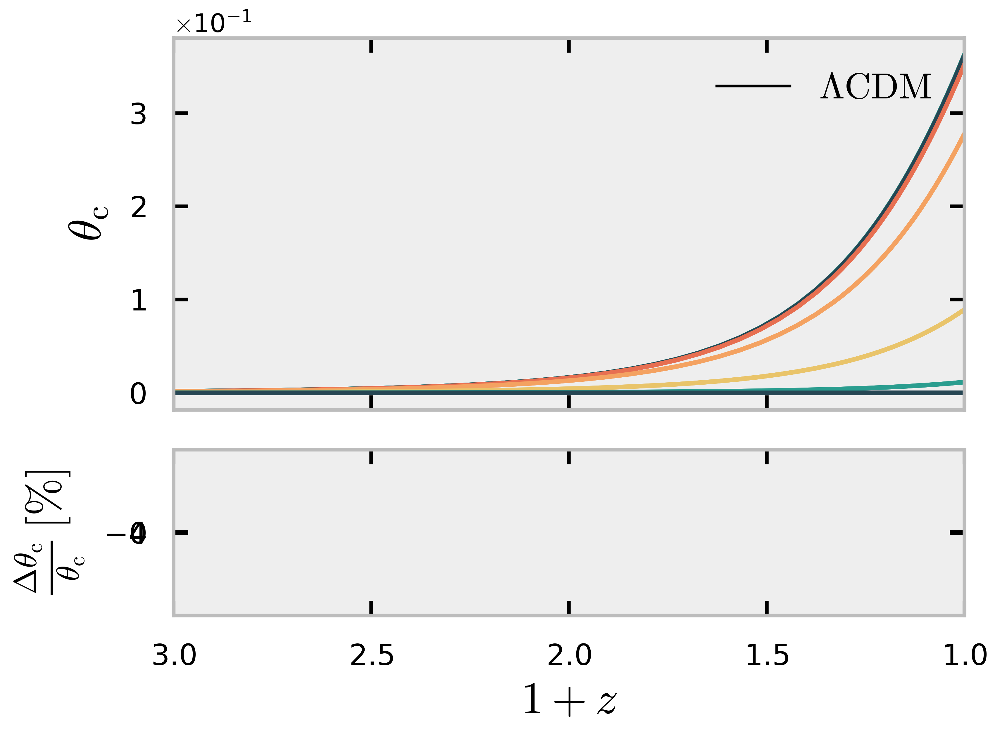

-3.283635960664846e-15


In [23]:
#print(k_sorted)
index_k_list = [0]
label = [r'$|\theta{\rm c}| \times10^{-4}$','','','','']

lw = 2.5
ls = ['--','-','-.', ':', '-']
plt.style.use('bmh')
plt.style.use(['ipynb', 'use_mathtext','colors5-light'])

fig = plt.figure(figsize=(8,6))
ax0 = plt.subplot2grid((3,1),(0,0), rowspan=2)
ax1 = plt.subplot2grid((3,1),(2,0), rowspan=1,sharex = ax0)

plt.subplots_adjust(hspace=0,wspace=0.)

from scipy.interpolate import interp1d
import numpy as np
import matplotlib.pyplot as plt

def build_interp1d_monotonic(x, y, kind='linear', clamp=True):
    """interp1d with sorting and duplicate-x handling."""
    x = np.asarray(x); y = np.asarray(y)
    order = np.argsort(x)
    x = x[order]; y = y[order]
    xu, inv, cnt = np.unique(x, return_inverse=True, return_counts=True)
    if np.any(cnt > 1):
        yu = np.zeros_like(xu, dtype=float)
        np.add.at(yu, inv, y)
        yu /= cnt
    else:
        yu = y
    fill = (yu[0], yu[-1]) if clamp else 'extrapolate'
    return interp1d(xu, yu, kind=kind, bounds_error=False, fill_value=fill, assume_sorted=True)

# --- your plotting code (only the relevant bits changed) ---

index_k = 0  # you set this explicitly
print(k_sorted[index_k])

standardPerturb = type3_models[0].get_perturbations()
a0 = standardPerturb['scalar'][index_k]['a']                 # standard grid
z0 = 1/a0 - 1
theta_c0 = standardPerturb['scalar'][index_k]['theta_qcdm']/standardPerturb['scalar'][index_k]['theta_scf']

# interpolator: δ_c^Lc(a)
f_theta0_of_a = build_interp1d_monotonic(a0, theta_c0, kind='linear', clamp=True)

# plot the Lc baseline on its own grid (top panel)
ax0.plot(1+z0, theta_c0, c='k', ls='-', label=r'$\Lambda{\rm CDM}$', lw=1.5)

for g in type3_gammas_plot:  # your beta values
    cosmoPerturb = type3_models[g].get_perturbations()
    a = cosmoPerturb['scalar'][index_k]['a']                  # this run's grid
    z = 1/a - 1
    theta_c = cosmoPerturb['scalar'][index_k]['theta_qcdm']/cosmoPerturb['scalar'][index_k]['theta_scf']

    # interpolate standard onto THIS grid => shapes now match
    theta_c0_on_a = f_theta0_of_a(a)

    # top panel
    ax0.plot(1+z, theta_c, lw=lw)

    # bottom panel: percent difference, guard against tiny denominators
    eps = 1e-300
    denom = np.where(np.abs(theta_c0_on_a) > eps, theta_c0_on_a, np.nan)
    rel = 100.0 * (theta_c - theta_c0_on_a) / denom

    ax1.plot(1+z, rel, lw=lw)

    #ax0.plot(1+z, np.abs(cosmoPerturb['scalar'][index_k]['delta_rho_scf'])*1e-4, c='k', ls='-', label = r'$\delta {\phi}$',lw=1.5)

    # ax0.set_ylabel(type3_gammas[g], size=25)
    ax1.set_xlabel(r'$1+z$', size=25)
    #ax0.set_xlim(1e5,1)
    # ax0.set_ylim(1e-3,1)
    #ax0.set_title('k = '+str(k_sorted[index_k]), size=20)
    ax0.tick_params(axis='both', which='major', labelsize=16, width=1.1)
    for tick in ax0.xaxis.get_major_ticks():
        tick.set_pad(10)
    for tick in ax0.yaxis.get_major_ticks():
        tick.set_pad(10)    

#ax.ticklabel_format(axis='y', style='sci', scilimits=(0,0), useMathText=True) #---------------------------> Scientific format
#ax.yaxis.offsetText.set_fontsize(20) #---------------------------> size of the scientific format

#ax0.set_xscale('log');ax0.set_yscale('log')
ax1.set_xscale('linear');ax1.set_yscale('linear')

ax1.set_ylabel(r'$ \frac{\Delta \theta_{\rm c}}{\theta_{\rm c}}\, [\%]$', size=25,labelpad=10)
ax0.set_ylabel(r'$ \theta_{\rm c}$', size=25,labelpad=10)

# #ns-f0 plot and ns-h0 plot 
# #ax0.set_xlim([1.e-3,0.1])
# ax1.set_xlim(3,1)
# ax0.set_ylim(0.45,1.25)
# ax1.set_ylim(-2,12)
# ax1.set_yticks([i for i in np.linspace(0,10,3)])
# ax1.set_xticks([i for i in np.linspace(3,1,5)])

#h0 plot
#ax0.set_xlim([1.e-3,0.1])
ax1.set_xlim(3,1)
# ax0.set_ylim(0.45,1.5)
ax1.set_ylim(-500,500)
ax1.set_yticks([i for i in np.linspace(-4,4,3)])
ax1.set_xticks([i for i in np.linspace(3,1,5)])
    
ax0.tick_params(axis='both', which='both', labelsize=16)
ax0.tick_params(axis='both', which='both', labelsize=16)

#---------------------------------------------------------------------------------> change ticklabels distance
ax1.tick_params(axis='both', which='both', labelsize=16)
ax1.tick_params(axis='both', which='both', labelsize=16)

for tick in ax1.xaxis.get_major_ticks():
    tick.set_pad(15)
for tick in ax0.yaxis.get_major_ticks():
    tick.set_pad(15)
for tick in ax1.yaxis.get_major_ticks():
    tick.set_pad(15)
    
ax0.tick_params(axis='both', which='both', labelsize=16)

    
ax0.xaxis.set_tick_params(which='major', size=8, width=2, direction='in', top='on')
ax0.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in', top='on')
ax0.yaxis.set_tick_params(which='major', size=8, width=2, direction='in', right='on')
ax0.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in', right='on')

ax1.tick_params(axis='both', which='both', labelsize=16)

    
ax1.xaxis.set_tick_params(which='major', size=8, width=2, direction='in', top='on')
ax1.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in', top='on')
ax1.yaxis.set_tick_params(which='major', size=8, width=2, direction='in', right='on')
ax1.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in', right='on')

#ax0.set_xscale('log')
#ax0.set_yscale('log')
# original_labels = ax0.get_xticks()
# labels = []
# for label in original_labels:
#     labels.append(int(np.log10(label)))
# ax0.set_xticklabels(labels)

ax1.ticklabel_format(axis='y', style='plain', useMathText=True)


for ax in (ax0, ax1):
    # copy the list so we don't iterate over lines we add
    lines = list(ax.get_lines())[1:]
    for ln in lines[::-1]:
        ax.plot(
            ln.get_xdata(), ln.get_ydata(),
            ls=ln.get_linestyle(),
            lw=ln.get_linewidth(),
            c=ln.get_color(),
            marker=ln.get_marker(),
            markersize=ln.get_markersize(),
            alpha=ln.get_alpha() if ln.get_alpha() is not None else 1.0,
            label="_nolegend_",  # labels starting with '_' are ignored by legend()
        )

ax0.legend(loc='upper right', frameon=boolean, prop={'size': 20},ncol=2,columnspacing=1)
plt.setp(ax0.get_xticklabels(), visible=False)
plt.rcParams['font.size'] = 20
plt.rcParams['axes.linewidth'] = 2
fig.tight_layout()
fig.tight_layout()
plt.savefig('thetac_der_constant.pdf')
#, transparent=True)

plt.show()

print(cosmoPerturb['scalar'][index_k]['theta_qcdm'][-1]*1e-4)

In [24]:
# import numpy as np
# import matplotlib.pyplot as plt
# from classy import Class

# gamma0 = 0.4
# Z_ini_values = [0.0, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4]

# a_ini = 1e-14
# k_h = np.logspace(-3, 1, 200)

# base_params = {
#     'output': 'mPk',
#     'P_k_max_h/Mpc': 10.0,
#     'z_pk': 0.0,

#     'h': 0.6736,
#     'omega_b': 0.02237,
#     'omega_cdm': 1e-10,
#     'omega_qcdm': 0.12038,
#     'A_s': 2.1e-9,
#     'n_s': 0.9649,
#     'tau_reio': 0.0544,

#     # Scalar field / Type-3 momentum model
#     'Omega_scf': 0.684,
#     'scf_potential': 'exp',

#     # Explicit-potential path requires BOTH of these
#     'scf_lambda': 0.5,
#     'scf_V0': 1.0,

#     # Let shooting retune V0 to hit Omega_scf
#     'scf_shooting_target': 'V0',
#     'scf_shooting_parameter': 1.0,

#     'scf_coupling_type': 'momentum',
#     'scf_gamma0': gamma0,

#     # Clean pressureless IDM
#     'idm_soundspeed': 'no',

#     # Manual scalar ICs
#     'attractor_ic_scf': 'no',
#     'scf_phi_ini': 0.0,

#     'background_verbose': 0,
#     'perturbations_verbose': 0,
#     'input_verbose': 0,
# }

# def get_bg_z(bg):
#     if 'z' in bg:
#         return np.asarray(bg['z'])
#     if '(.)a' in bg:
#         return 1.0 / np.asarray(bg['(.)a']) - 1.0
#     if 'a' in bg:
#         return 1.0 / np.asarray(bg['a']) - 1.0
#     raise KeyError("Could not find z or a in CLASS background keys.")

# results = {}
# fid_pk = None

# for Z_ini in Z_ini_values:
#     params = dict(base_params)
#     params['scf_phi_prime_ini'] = -a_ini * Z_ini

#     cosmo = Class()

#     try:
#         cosmo.set(params)
#         cosmo.compute()

#         bg = cosmo.get_background()
#         z = get_bg_z(bg)

#         Z = np.asarray(bg['scf_mom'])
#         gamma = np.asarray(bg['gamma_scf'])
#         gamma_Z = np.asarray(bg['dgamma_scf'])
#         rho_qcdm = np.asarray(bg['(.)rho_qcdm'])
#         rho_scf = np.asarray(bg['(.)rho_scf'])
#         rho_crit = np.asarray(bg['(.)rho_crit'])
#         p_scf = np.asarray(bg['(.)p_scf'])

#         R = Z * gamma_Z / (3.0 * rho_qcdm)
#         G = gamma / rho_qcdm
#         Omega_scf = rho_scf / rho_crit
#         w_scf = p_scf / rho_scf

#         h = cosmo.h()
#         pk = np.array([cosmo.pk(k*h, 0.0) * h**3 for k in k_h])

#         if Z_ini == 0.0:
#             fid_pk = pk.copy()

#         results[Z_ini] = {
#             'cosmo': cosmo,
#             'bg': bg,
#             'z': z,
#             'R': R,
#             'G': G,
#             'Omega_scf': Omega_scf,
#             'w_scf': w_scf,
#             'pk': pk,
#         }

#         print("\n" + "="*80)
#         print(f"Z_ini = {Z_ini:.1e}, phi_prime_ini = {-a_ini*Z_ini:.3e}")
#         print(f"max |R| = {np.nanmax(np.abs(R)):.3e}")
#         print(f"max |gamma/rho_qcdm| = {np.nanmax(np.abs(G)):.3e}")
#         print(f"Omega_scf_ini = {Omega_scf[0]:.3e}")
#         print(f"Omega_scf_today = {Omega_scf[-1]:.6f}")
#         print(f"w_scf_ini = {w_scf[0]:.6f}")
#         print(f"w_scf_today = {w_scf[-1]:.6f}")

#         for zz in [1000, 100, 10, 3, 1, 0]:
#             i = np.argmin(np.abs(z - zz))
#             print(
#                 f"z={z[i]:9.3g}  "
#                 f"R={R[i]: .3e}  "
#                 f"gamma/rho_qcdm={G[i]: .3e}  "
#                 f"Omega_scf={Omega_scf[i]: .3e}  "
#                 f"w_scf={w_scf[i]: .3e}"
#             )

#     except Exception as err:
#         print("\n" + "="*80)
#         print(f"FAILED for Z_ini={Z_ini:.1e}, phi_prime_ini={-a_ini*Z_ini:.3e}")
#         print(err)
#         try:
#             cosmo.struct_cleanup()
#             cosmo.empty()
#         except Exception:
#             pass

# plt.figure(figsize=(8, 5))
# for Z_ini, r in results.items():
#     z = r['z']
#     R = r['R']
#     x = 1.0 + z
#     y = np.abs(R)

#     mask = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)
#     if np.any(mask):
#         plt.loglog(x[mask], y[mask], label=fr'$Z_{{ini}}={Z_ini:g}$')

# plt.axhline(1.0, color='k', lw=1)
# plt.axhline(1e-2, color='k', lw=1, ls=':')
# plt.gca().invert_xaxis()
# plt.xlabel(r'$1+z$')
# plt.ylabel(r'$|Z\gamma_Z/(3\rho_{\rm idm})|$')
# plt.title(r'Effective Type-3 momentum strength')
# plt.legend()
# plt.tight_layout()
# plt.show()

# if fid_pk is not None:
#     plt.figure(figsize=(8, 5))
#     for Z_ini, r in results.items():
#         if Z_ini == 0.0:
#             continue
#         plt.semilogx(k_h, r['pk']/fid_pk, label=fr'$Z_{{ini}}={Z_ini:g}$')

#     plt.axhline(1.0, color='k', lw=1)
#     plt.xlabel(r'$k\,[h/{\rm Mpc}]$')
#     plt.ylabel(r'$P(k)/P_{\rm fid}(k)$')
#     plt.title(r'Matter power response to $Z_{\rm ini}$')
#     plt.legend()
#     plt.tight_layout()
#     plt.show()
# else:
#     print("No fiducial Z_ini=0 run succeeded, so the P(k) ratio plot was skipped.")

<!-- ## 9) Cleanup -->


In [25]:
# for _name in ['lcdm','coup','conf','disf']:
#     if _name in globals() and globals()[_name] is not None:
#         try:
#             cleanup(globals()[_name])
#         except Exception:
#             pass

# if 'type3_models' in globals():
#     for _m in type3_models.values():
#         try:
#             cleanup(_m)
#         except Exception:
#             pass


In [26]:
# 

## 9) Entropy validation against `class_entropy`

These cells reproduce the derivative (`h_0`) and algebraic (`g_0`, called `f_0` in the old entropy notebook) scans from `Plots_entropy.ipynb`, but using this code's explicit entropy inputs and `omega_qcdm` species. The fiducial curve is true LCDM, not the zero-coupling SCF run.


In [27]:
# Entropy validation setup: derivative and algebraic scans from class_entropy/Plots_entropy.ipynb
import os

try:
    plt.style.use(['ipynb', 'use_mathtext', 'colors5-light'])
except OSError:
    plt.style.use('bmh')

entropy_lw = 2.5
entropy_ls = ['--', '-', '-.', ':', (0, (5, 1))]
entropy_colors = ['#AE76A6', '#993955', '#E6B89C', '#37515F', '#A3C3D9']
entropy_boolean = False

# Same output scales used in the old entropy notebook.
entropy_k_scale = [
    0.0001*0.67556,
    0.1*0.67556,
    0.125*0.67556,
    0.01*0.67556,
    1.0*0.67556,
    0.2*0.67556,
    2.0*0.67556,
]
entropy_output_k = ','.join(str(k) for k in np.sort(entropy_k_scale))

# The old notebook includes a sixth tiny-amplitude diagnostic value; the published-style plots use the first five.
entropy_plot_indices = [0, 1, 2, 3, 4]

entropy_case_specs = {
    'derivative': {
        'parameter': 'h0',
        'g0s': 6*[0.0],
        'h0s': [0.0, 0.01, 0.03, -0.02, -0.04, 0.0001],
        'title': 'Entropy derivative coupling',
    },
    'algebraic': {
        'parameter': 'g0',
        'g0s': [0.0, 0.001, 0.003, -0.002, -0.004, 1e-12],
        'h0s': 6*[0.0],
        'title': 'Entropy algebraic coupling',
    },
}


def entropy_common_params():
    return {
        'output': 'tCl,pCl,dCl,lCl,mPk,mTk',
        'lensing': 'yes',
        '100*theta_s': 1.041856e+00,
        'omega_b': 2.237235e-02,
        'ln10^{10}A_s': 3.050050e+00,
        'n_s': 9.674727e-01,
        'tau_reio': 5.564022e-02,
        'YHe': 2.478407e-01,
        'evolver': 0,
        'gauge': 'synchronous',
        'P_k_max_h/Mpc': 10.0,
        'l_max_scalars': 3000,
        'k_output_values': entropy_output_k,
        'write background': 'yes',
        'z_pk': '0',
        'z_max_pk': 1000.0,
        # 'l_switch_limber_for_nc_local_over_z': 1000,
        # 'l_switch_limber_for_nc_los_over_z': 1000,
        # 'start_small_k_at_tau_c_over_tau_h': 1e-5,
        # 'start_large_k_at_tau_h_over_tau_k': 1e-5,
    }


def entropy_lcdm_params():
    params = entropy_common_params()
    params.update({
        'omega_cdm': 1.157303e-01,
        'Omega_fld': 0.0,
        'Omega_scf': 0.0,
    })
    return params


def entropy_model_params(case_name, index):
    spec = entropy_case_specs[case_name]
    params = entropy_common_params()
    params.update({
        # Keep a tiny uncoupled CDM component to define synchronous gauge; QCDM carries dark matter.
        'omega_cdm': 2.e-10,
        'omega_qcdm': 1.157303e-01,
        'Omega_Lambda': 0.0,
        'Omega_fld': 0.0,
        'Omega_scf': -1.0,
        'scf_potential': 'exp',
        'scf_coupling_type': 'entropy',
        # Old entropy notebook scf_parameters = [lambda, V0, f0, h0, As, ns, kp, kc, pc, phi_ini, phi_prime_ini].
        # In this code the old f0 is named g0 and passed explicitly to avoid the different scf_parameters ordering.
        'scf_lambda': 0.1,
        'scf_V0': 1.0,
        'scf_g0': spec['g0s'][index],
        'scf_h0': spec['h0s'][index],
        'scf_As': 1.0,
        'scf_ns': 0.0,
        'scf_kp': 0.05,
        'scf_kc': 1.0,
        'scf_pc': 2.0,
        'attractor_ic_scf': 'no',
        'scf_phi_ini': 1.0,
        'scf_phi_prime_ini': -8.e-12,
        'scf_shooting_target': 'scf_V0',
        # Keep non-entropy IDM interactions switched off for a pure entropy comparison.
    })
    return params


def run_class_entropy(params):
    cosmo = Class()
    cosmo.set(params)
    cosmo.compute()
    return cosmo


def cleanup_entropy_objects():
    if 'cleanup' not in globals():
        return
    if 'entropy_standard' in globals() and entropy_standard is not None:
        try:
            cleanup(entropy_standard)
        except Exception:
            pass
    if 'entropy_models' in globals():
        for models in entropy_models.values():
            for model in models:
                if model is not None:
                    try:
                        cleanup(model)
                    except Exception:
                        pass


cleanup_entropy_objects()

entropy_standard = run_class_entropy(entropy_lcdm_params())
entropy_models = {}
entropy_failures = {}

for case_name, spec in entropy_case_specs.items():
    entropy_models[case_name] = []
    entropy_failures[case_name] = []
    for index in range(len(spec['g0s'])):
        params = entropy_model_params(case_name, index)
        try:
            model = run_class_entropy(params)
            entropy_models[case_name].append(model)
            entropy_failures[case_name].append(None)
        except Exception as err:
            entropy_models[case_name].append(None)
            entropy_failures[case_name].append(err)
            print(f"{case_name} entropy run {index} failed: {err}")

print('Computed entropy validation models:')
for case_name, models in entropy_models.items():
    ok = sum(model is not None for model in models)
    print(f"  {case_name}: {ok}/{len(models)} successful")

for case_name, failures in entropy_failures.items():
    for index, err in enumerate(failures):
        if err is not None:
            print(f"  FAILURE {case_name}[{index}]: {err}")

# Probe one non-zero model per branch. If these columns are missing, the entropy flag was not active.
entropy_probe_keys = ['g_scf', 'dg_scf', 'h_scf', 'As_scf', 'kp_scf', 'kc_scf', 'pc_scf', '(.)rho_qcdm']
for case_name, spec in entropy_case_specs.items():
    probe_index = None
    for index in entropy_plot_indices:
        value = spec['g0s'][index] if spec['parameter'] == 'g0' else spec['h0s'][index]
        if value != 0.0 and entropy_models[case_name][index] is not None:
            probe_index = index
            break
    if probe_index is None:
        print(f"  {case_name}: no successful non-zero model available to probe.")
        continue
    bg = entropy_models[case_name][probe_index].get_background()
    present = [key for key in entropy_probe_keys if key in bg]
    missing = [key for key in entropy_probe_keys if key not in bg]
    print(f"  {case_name}[{probe_index}] entropy background columns present: {present}")
    if missing:
        print(f"  {case_name}[{probe_index}] missing columns: {missing}")
    for key in present:
        print(f"    {key}(today) = {bg[key][-1]: .6e}")
    try:
        h_val = entropy_models[case_name][probe_index].h()
        pk_probe = entropy_models[case_name][probe_index].pk(0.1*h_val, 0.0)*h_val**3
        cl_probe = entropy_models[case_name][probe_index].lensed_cl(20)
        print(f"    h = {h_val: .6e}, P(k=0.1 h/Mpc,z=0) = {pk_probe: .6e}")
        print(f"    finite TT count ell<=20 = {np.isfinite(cl_probe['tt']).sum()}/{len(cl_probe['tt'])}")
    except Exception as err:
        print(f"    raw output probe failed: {err}")


Computed entropy validation models:
  derivative: 6/6 successful
  algebraic: 6/6 successful
  derivative[1] entropy background columns present: ['g_scf', 'dg_scf', 'h_scf', 'As_scf', 'kp_scf', 'kc_scf', 'pc_scf', '(.)rho_qcdm']
    g_scf(today) =  0.000000e+00
    dg_scf(today) =  0.000000e+00
    h_scf(today) =  1.000000e-02
    As_scf(today) =  1.000000e+00
    kp_scf(today) =  5.000000e-02
    kc_scf(today) =  1.000000e+00
    pc_scf(today) =  2.000000e+00
    (.)rho_qcdm(today) =  1.287673e-08
    h =  6.940340e-01, P(k=0.1 h/Mpc,z=0) =  5.403045e+03
    finite TT count ell<=20 = 21/21
  algebraic[1] entropy background columns present: ['g_scf', 'dg_scf', 'h_scf', 'As_scf', 'kp_scf', 'kc_scf', 'pc_scf', '(.)rho_qcdm']
    g_scf(today) =  1.494748e-10
    dg_scf(today) =  1.449830e-10
    h_scf(today) =  0.000000e+00
    As_scf(today) =  1.000000e+00
    kp_scf(today) =  5.000000e-02
    kc_scf(today) =  1.000000e+00
    pc_scf(today) =  2.000000e+00
    (.)rho_qcdm(today) =  1.287

In [28]:
# Entropy validation plotting helpers

def entropy_value_label(case_name, index):
    spec = entropy_case_specs[case_name]
    parameter = spec['parameter']
    value = spec['g0s'][index] if parameter == 'g0' else spec['h0s'][index]
    label_name = 'g_0' if parameter == 'g0' else 'h_0'
    if value == 0:
        value_text = '0'
    elif abs(value) < 0.01:
        value_text = f'{value:.4g}'
    else:
        value_text = f'{value:.2f}'
    return rf'${label_name} = {value_text}$'


def entropy_existing_indices(case_name):
    failed = []
    indices = []
    for index in entropy_plot_indices:
        if index >= len(entropy_models[case_name]) or entropy_models[case_name][index] is None:
            failed.append(index)
        else:
            indices.append(index)
    if failed:
        details = '; '.join(f'{i}: {entropy_failures[case_name][i]}' for i in failed if i < len(entropy_failures[case_name]))
        raise RuntimeError(f'Entropy {case_name} runs failed or are missing for plotted indices {failed}. Details: {details}')
    return indices


def entropy_pk_grid(model, kk, z=0.0):
    h_model = model.h()
    values = []
    for k in kk:
        try:
            values.append(model.pk(k*h_model, z)*h_model**3)
        except Exception:
            values.append(np.nan)
    return np.array(values, dtype=float)


def entropy_relative_percent(numerator, denominator):
    numerator = np.asarray(numerator, dtype=float)
    denominator = np.asarray(denominator, dtype=float)
    out = np.full_like(numerator, np.nan, dtype=float)
    mask = np.isfinite(numerator) & np.isfinite(denominator) & (np.abs(denominator) > 0.)
    out[mask] = 100.*(numerator[mask] - denominator[mask])/denominator[mask]
    return out


def entropy_ratio_percent(numerator, denominator):
    numerator = np.asarray(numerator, dtype=float)
    denominator = np.asarray(denominator, dtype=float)
    out = np.full_like(numerator, np.nan, dtype=float)
    mask = np.isfinite(numerator) & np.isfinite(denominator) & (np.abs(denominator) > 0.)
    out[mask] = 100.*(numerator[mask]/denominator[mask] - 1.)
    return out


def entropy_nanmax_abs(values):
    values = np.asarray(values, dtype=float)
    finite = np.isfinite(values)
    if not np.any(finite):
        return np.nan
    return np.max(np.abs(values[finite]))


def entropy_finite_summary(name, values):
    values = np.asarray(values, dtype=float)
    finite = np.isfinite(values)
    if not np.any(finite):
        return f'{name}: no finite values ({finite.sum()}/{values.size})'
    return f'{name}: finite {finite.sum()}/{values.size}, min={np.nanmin(values):.3e}, max={np.nanmax(values):.3e}'


def entropy_format_axes(ax):
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.xaxis.set_tick_params(which='major', size=8, width=2, direction='in', top=True)
    ax.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in', top=True)
    ax.yaxis.set_tick_params(which='major', size=8, width=2, direction='in', right=True)
    ax.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in', right=True)


def entropy_savefig(filename):
    out_dir = os.path.join('notebooks', 'figures')
    os.makedirs(out_dir, exist_ok=True)
    plt.savefig(os.path.join(out_dir, filename), bbox_inches='tight')



def entropy_print_delta_summary(case_name):
    kk = np.logspace(-4, 0, 300)
    pk_standard = entropy_pk_grid(entropy_standard, kk)
    cls_tt_standard = entropy_standard.lensed_cl(2500)
    cltt_standard = cls_tt_standard['tt'][2:]
    cls_pp_standard = entropy_standard.lensed_cl(2000)
    clpp_standard = cls_pp_standard['pp'][2:]

    print(f'Entropy diagnostic: {case_name}')
    for index in entropy_existing_indices(case_name):
        model = entropy_models[case_name][index]
        pk_model = entropy_pk_grid(model, kk)
        dpk = entropy_relative_percent(pk_model, pk_standard)
        cls_tt = model.lensed_cl(2500)
        dtt = entropy_relative_percent(cls_tt['tt'][2:], cltt_standard)
        cls_pp = model.lensed_cl(2000)
        dpp = entropy_ratio_percent(cls_pp['pp'][2:], clpp_standard)
        if index == entropy_existing_indices(case_name)[0]:
            print('   ', entropy_finite_summary('P_LCDM', pk_standard))
            print('   ', entropy_finite_summary('P_model', pk_model))
            print('   ', entropy_finite_summary('TT_LCDM', cltt_standard))
            print('   ', entropy_finite_summary('TT_model', cls_tt['tt'][2:]))
            print('   ', entropy_finite_summary('PP_LCDM', clpp_standard))
            print('   ', entropy_finite_summary('PP_model', cls_pp['pp'][2:]))
        print(
            f"  {entropy_value_label(case_name, index)}: "
            f"max|dP/P|={entropy_nanmax_abs(dpk):.3e}% "
            f"max|dTT/TT|={entropy_nanmax_abs(dtt):.3e}% "
            f"max|dPP/PP|={entropy_nanmax_abs(dpp):.3e}%"
        )


def plot_entropy_mpk(case_name):
    kk = np.logspace(-5, np.log10(10), 1000)  # k in h/Mpc
    pk_standard = entropy_pk_grid(entropy_standard, kk)

    fig = plt.figure(figsize=(8, 6))
    ax0 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
    ax1 = plt.subplot2grid((3, 1), (2, 0), rowspan=1, sharex=ax0)
    plt.subplots_adjust(hspace=0, wspace=0.)

    ax0.plot(kk, pk_standard, label=r'$\Lambda{\rm CDM}$', c='k', ls='-', lw=1.5)
    for style_index, index in enumerate(entropy_existing_indices(case_name)):
        model = entropy_models[case_name][index]
        pk_model = entropy_pk_grid(model, kk)
        delta = entropy_relative_percent(pk_model, pk_standard)
        ax0.plot(kk, pk_model, label=entropy_value_label(case_name, index),
                 lw=entropy_lw, ls=entropy_ls[style_index], c=entropy_colors[style_index])
        ax1.plot(kk, delta, lw=entropy_lw, ls=entropy_ls[style_index], c=entropy_colors[style_index])

    ax0.set_xscale('log')
    ax0.set_yscale('log')
    ax0.set_xlim(1.e-4, 1.0)
    ax0.set_ylim(1.e1, 5.e4)
    ax1.set_xscale('log')
    ax1.set_yscale('linear')
    ax1.set_xlim(1.e-4, 1.0)
    ax1.set_ylim(-70, 70)
    ax1.set_yticks(np.linspace(-50, 50, 3))
    ax1.set_xlabel(r'$k \,\,\,\, [h/{\rm Mpc}]$', size=25)
    ax0.set_ylabel(r'${\rm P} (k) \, [{\rm Mpc}/h]^3$', size=25, labelpad=15)
    ax1.set_ylabel(r'$\frac{\Delta {\rm P}(k)}{{\rm P}(k)}\, [\%]$', size=25, labelpad=10)
    ax1.ticklabel_format(axis='y', style='plain', useMathText=True)
    entropy_format_axes(ax0)
    entropy_format_axes(ax1)
    ax0.legend(loc='upper right', frameon=entropy_boolean, prop={'size': 16}, ncol=2, columnspacing=1)
    fig.suptitle(entropy_case_specs[case_name]['title'], y=0.98)
    fig.tight_layout()
    entropy_savefig(f'entropy_{case_name}_mpk.png')
    plt.show()


def plot_entropy_tt(case_name):
    cls_standard = entropy_standard.lensed_cl(2500)
    ell = cls_standard['ell'][2:]
    cltt_standard = cls_standard['tt'][2:]

    fig = plt.figure(figsize=(8, 6))
    ax0 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
    ax1 = plt.subplot2grid((3, 1), (2, 0), rowspan=1, sharex=ax0)
    plt.subplots_adjust(hspace=0, wspace=0.)

    ax0.plot(ell, cltt_standard*ell*(ell+1)/2./np.pi, label=r'$\Lambda{\rm CDM}$', c='k', ls='-', lw=1.5)
    for style_index, index in enumerate(entropy_existing_indices(case_name)):
        cls = entropy_models[case_name][index].lensed_cl(2500)
        cltt = cls['tt'][2:]
        delta = entropy_relative_percent(cltt, cltt_standard)
        ax0.plot(ell, cltt*ell*(ell+1)/2./np.pi, label=entropy_value_label(case_name, index),
                 lw=entropy_lw, ls=entropy_ls[style_index], c=entropy_colors[style_index])
        ax1.plot(ell, delta, lw=entropy_lw, ls=entropy_ls[style_index], c=entropy_colors[style_index])

    ax0.set_xscale('log')
    ax0.set_yscale('linear')
    ax0.set_xlim(2, 2500)
    ax0.set_ylim(0.e-10, 10e-10)
    ax1.set_xscale('log')
    ax1.set_yscale('linear')
    ax1.set_xlim(2, 2500)
    ax1.set_ylim(-0.6, 0.6)
    ax1.set_yticks(np.linspace(-0.4, 0.4, 3))
    ax1.set_xlabel(r'$\ell$', size=25)
    ax0.set_ylabel(r'$\ell(\ell+1)\, C_\ell^\mathrm{TT}/2\pi$', size=25, labelpad=15)
    ax1.set_ylabel(r'$\frac{\Delta C_\ell^\mathrm{TT}}{C_\ell^\mathrm{TT}}\, [\%]$', size=25, labelpad=5)
    ax0.ticklabel_format(axis='y', style='sci', scilimits=(0, 0), useMathText=True)
    ax1.ticklabel_format(axis='y', style='plain', useMathText=True)
    entropy_format_axes(ax0)
    entropy_format_axes(ax1)
    ax0.legend(loc='best', frameon=entropy_boolean, prop={'size': 16}, ncol=2, columnspacing=1)
    fig.suptitle(entropy_case_specs[case_name]['title'], y=0.98)
    fig.tight_layout()
    entropy_savefig(f'entropy_{case_name}_tt.png')
    plt.show()


def plot_entropy_lensing(case_name):
    cls_standard = entropy_standard.lensed_cl(2000)
    ell = cls_standard['ell'][2:]
    clpp_standard = cls_standard['pp'][2:]

    fig = plt.figure(figsize=(8, 6))
    ax0 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
    ax1 = plt.subplot2grid((3, 1), (2, 0), rowspan=1, sharex=ax0)
    plt.subplots_adjust(hspace=0, wspace=0.)

    ax0.plot(ell, clpp_standard*(ell*(ell+1))**2./2./np.pi,
             label=r'$\Lambda{\rm CDM}$', c='k', ls='-', lw=1.5)
    for style_index, index in enumerate(entropy_existing_indices(case_name)):
        cls = entropy_models[case_name][index].lensed_cl(2000)
        clpp = cls['pp'][2:]
        delta = entropy_ratio_percent(clpp, clpp_standard)
        ax0.plot(ell, clpp*(ell*(ell+1))**2./2./np.pi, label=entropy_value_label(case_name, index),
                 lw=entropy_lw, ls=entropy_ls[style_index], c=entropy_colors[style_index])
        ax1.plot(ell, delta, lw=entropy_lw, ls=entropy_ls[style_index], c=entropy_colors[style_index])

    ax0.set_xscale('log')
    ax0.set_yscale('linear')
    ax0.set_xlim(2, 2000)
    ax0.set_ylim(-2.e-8, 1.5e-7)
    ax1.set_xscale('log')
    ax1.set_yscale('linear')
    ax1.set_xlim(2, 2000)
    ax1.set_ylim(-4, 4)
    ax1.set_yticks(np.linspace(-3, 3, 3))
    ax1.set_xlabel(r'$\ell$', size=25)
    ax0.set_ylabel(r'$[\ell(\ell+1)]^2\, C_\ell^{\phi\phi}/2 \pi$', size=25, labelpad=23)
    ax1.set_ylabel(r'$\frac{\Delta C_\ell^{\phi\phi}}{C_\ell^{\phi\phi}}\, [\%]$', size=25)
    ax0.ticklabel_format(axis='y', style='sci', scilimits=(0, 0), useMathText=True)
    entropy_format_axes(ax0)
    entropy_format_axes(ax1)
    ax0.legend(loc='best', frameon=entropy_boolean, prop={'size': 16}, ncol=2, columnspacing=1)
    fig.suptitle(entropy_case_specs[case_name]['title'], y=0.98)
    fig.tight_layout()
    entropy_savefig(f'entropy_{case_name}_lensing.png')
    plt.show()


def plot_entropy_summary(case_name):
    fig, (ax_top, ax_mid, ax_bot) = plt.subplots(
        3, 1, figsize=(8, 8), sharex=False, gridspec_kw={'height_ratios': [1, 1, 1]}
    )

    kk = np.logspace(-5, np.log10(10), 1000)
    pk_standard = entropy_pk_grid(entropy_standard, kk)
    cls_tt_standard = entropy_standard.lensed_cl(2500)
    ell_tt = cls_tt_standard['ell'][2:]
    cltt_standard = cls_tt_standard['tt'][2:]
    cls_pp_standard = entropy_standard.lensed_cl(2000)
    ell_pp = cls_pp_standard['ell'][2:]
    clpp_standard = cls_pp_standard['pp'][2:]

    for style_index, index in enumerate(entropy_existing_indices(case_name)):
        model = entropy_models[case_name][index]
        pk_model = entropy_pk_grid(model, kk)
        ax_top.plot(kk, entropy_relative_percent(pk_model, pk_standard),
                    label=entropy_value_label(case_name, index), lw=entropy_lw,
                    ls=entropy_ls[style_index], c=entropy_colors[style_index])

        cls_tt = model.lensed_cl(2500)
        cltt = cls_tt['tt'][2:]
        ax_mid.plot(ell_tt, entropy_relative_percent(cltt, cltt_standard),
                    lw=entropy_lw, ls=entropy_ls[style_index], c=entropy_colors[style_index])

        cls_pp = model.lensed_cl(2000)
        clpp = cls_pp['pp'][2:]
        ax_bot.plot(ell_pp, entropy_ratio_percent(clpp, clpp_standard),
                    lw=entropy_lw, ls=entropy_ls[style_index], c=entropy_colors[style_index])

    ax_top.set_xscale('log')
    ax_top.set_xlim(1.e-4, 1.0)
    ax_top.set_ylabel(r'$\Delta {\rm P}(k)/{\rm P}(k)\, [\%]$', size=18, labelpad=10)
    ax_top.set_xlabel(r'$k \, [h/{\rm Mpc}]$', size=18, labelpad=10)
    ax_top.xaxis.set_label_position('top')
    ax_top.xaxis.set_tick_params(which='major', size=8, width=2, direction='in', top=True, labeltop=True, labelbottom=False)
    ax_top.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in', top=True)
    ax_top.yaxis.set_tick_params(which='major', size=8, width=2, direction='in', right=True)
    ax_top.legend(loc='best', frameon=entropy_boolean, prop={'size': 14}, ncol=2, columnspacing=1)

    ax_mid.axhline(0, color='k', ls='-', lw=1.5, alpha=0.5)
    ax_mid.set_xscale('log')
    ax_mid.set_xlim(2, 2500)
    ax_mid.set_ylabel(r'$\Delta C_\ell^\mathrm{TT}/C_\ell^\mathrm{TT}\, [\%]$', size=18, labelpad=5)

    ax_bot.axhline(0, color='k', ls='-', lw=1.5, alpha=0.5)
    ax_bot.set_xscale('log')
    ax_bot.set_xlim(2, 2000)
    ax_bot.set_xlabel(r'$\ell$', size=18)
    ax_bot.set_ylabel(r'$\Delta C_\ell^{\phi\phi}/C_\ell^{\phi\phi}\, [\%]$', size=18)

    for ax in (ax_top, ax_mid, ax_bot):
        entropy_format_axes(ax)

    fig.suptitle(entropy_case_specs[case_name]['title'], y=0.98)
    fig.tight_layout()
    entropy_savefig(f'entropy_{case_name}_summary.png')
    plt.show()


Entropy diagnostic: derivative
    P_LCDM: finite 300/300, min=6.509e+01, max=2.699e+04
    P_model: finite 300/300, min=6.507e+01, max=2.695e+04
    TT_LCDM: finite 2499/2499, min=1.055e-17, max=1.504e-10
    TT_model: finite 2499/2499, min=1.055e-17, max=1.504e-10
    PP_LCDM: finite 1999/1999, min=5.375e-22, max=8.480e-09
    PP_model: finite 1999/1999, min=5.375e-22, max=8.480e-09
  $h_0 = 0$: max|dP/P|=1.723e-01% max|dTT/TT|=5.148e-02% max|dPP/PP|=7.826e-02%
  $h_0 = 0.01$: max|dP/P|=2.040e+01% max|dTT/TT|=1.187e-01% max|dPP/PP|=7.138e-01%
  $h_0 = 0.03$: max|dP/P|=5.418e+01% max|dTT/TT|=3.401e-01% max|dPP/PP|=2.095e+00%
  $h_0 = -0.02$: max|dP/P|=4.765e+01% max|dTT/TT|=2.105e-01% max|dPP/PP|=1.465e+00%
  $h_0 = -0.04$: max|dP/P|=1.046e+02% max|dTT/TT|=4.278e-01% max|dPP/PP|=2.990e+00%


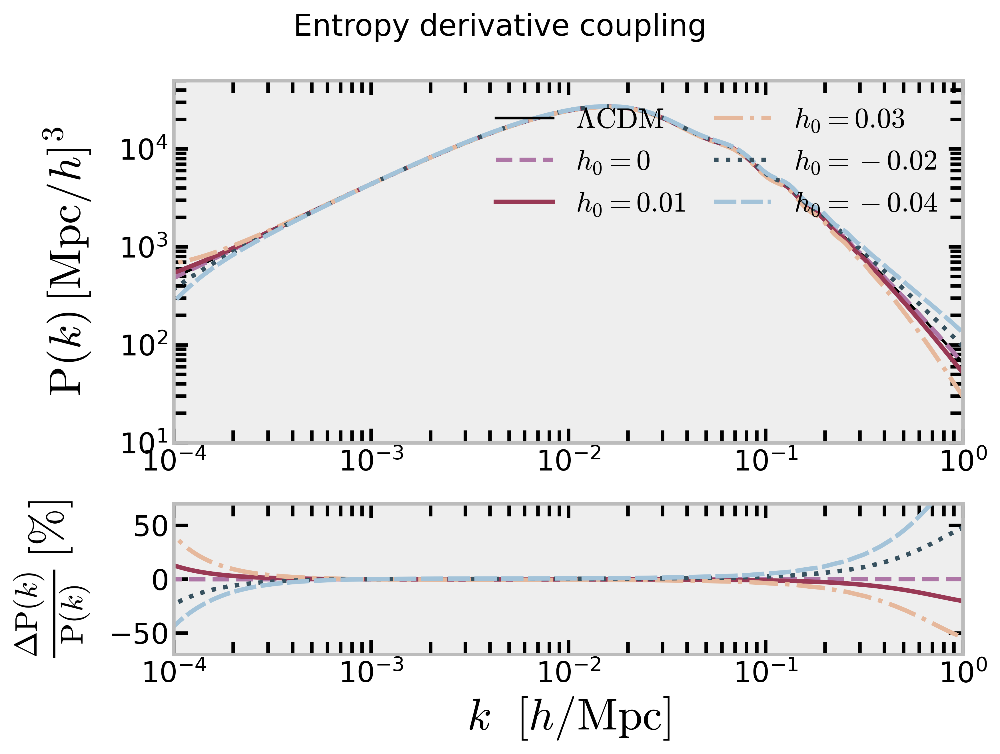

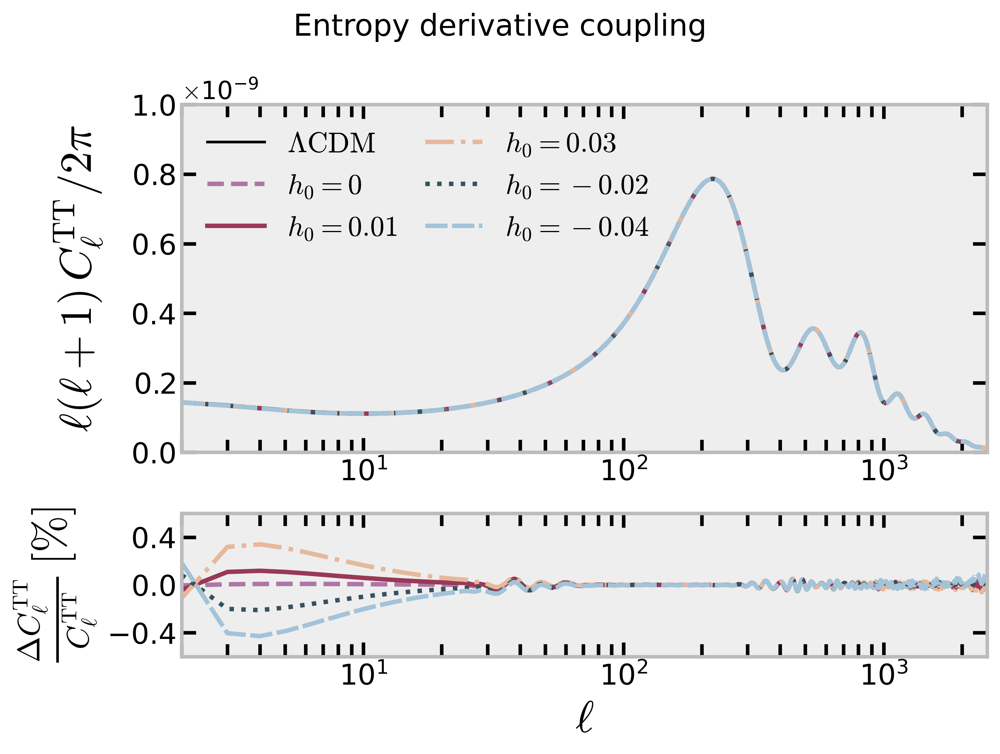

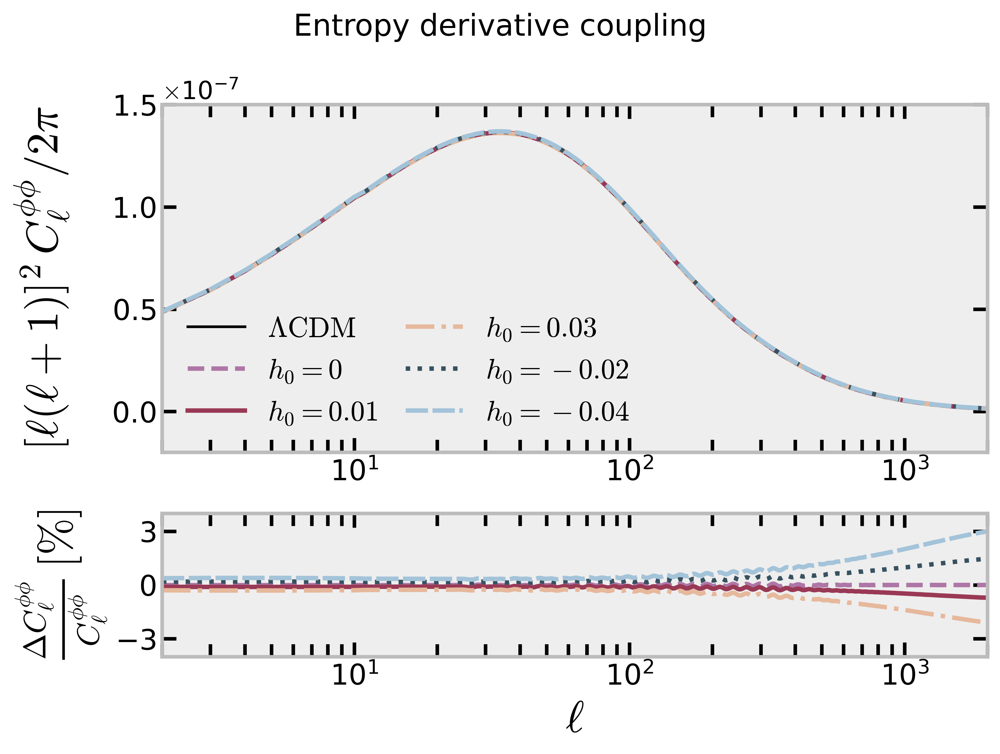

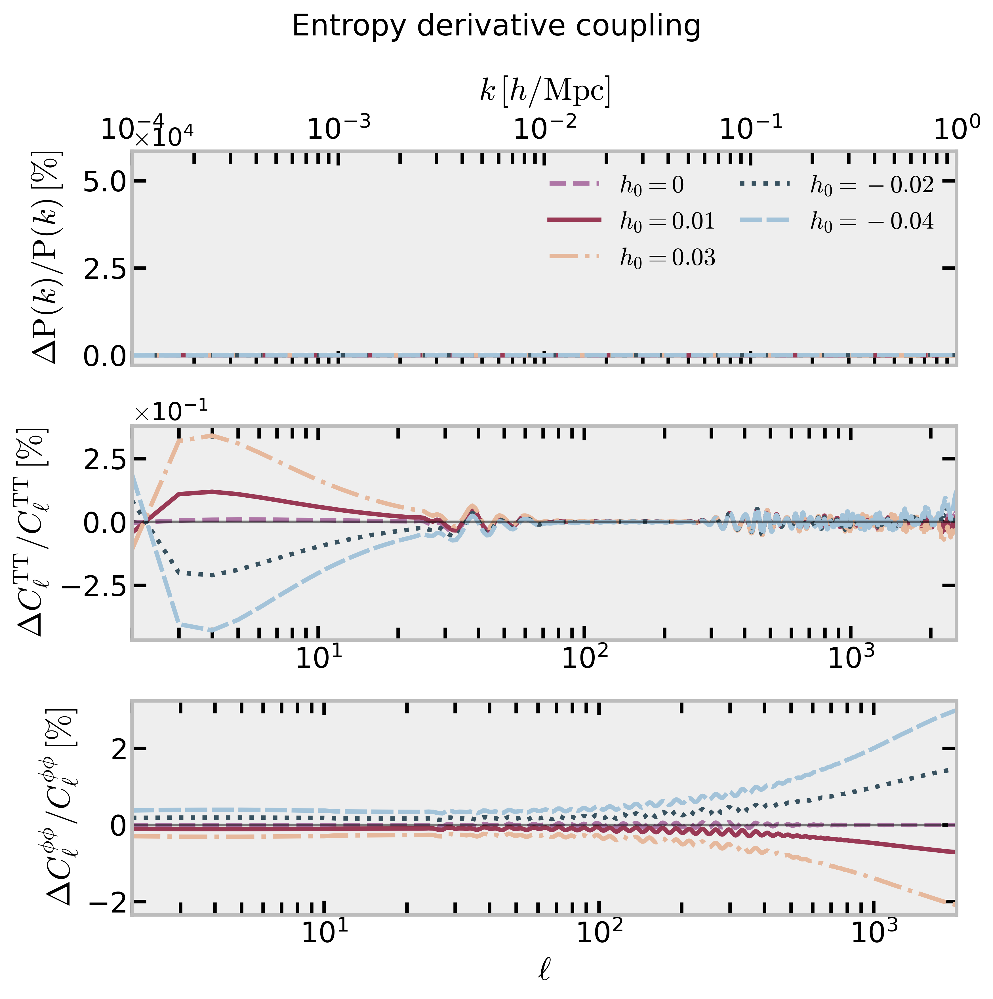

Entropy diagnostic: algebraic
    P_LCDM: finite 300/300, min=6.509e+01, max=2.699e+04
    P_model: finite 300/300, min=6.507e+01, max=2.695e+04
    TT_LCDM: finite 2499/2499, min=1.055e-17, max=1.504e-10
    TT_model: finite 2499/2499, min=1.055e-17, max=1.504e-10
    PP_LCDM: finite 1999/1999, min=5.375e-22, max=8.480e-09
    PP_model: finite 1999/1999, min=5.375e-22, max=8.480e-09
  $g_0 = 0$: max|dP/P|=1.723e-01% max|dTT/TT|=5.148e-02% max|dPP/PP|=7.826e-02%
  $g_0 = 0.001$: max|dP/P|=2.563e+01% max|dTT/TT|=1.478e-01% max|dPP/PP|=8.997e-01%
  $g_0 = 0.003$: max|dP/P|=6.548e+01% max|dTT/TT|=4.284e-01% max|dPP/PP|=2.627e+00%
  $g_0 = -0.002$: max|dP/P|=6.248e+01% max|dTT/TT|=2.681e-01% max|dPP/PP|=1.863e+00%
  $g_0 = -0.004$: max|dP/P|=1.401e+02% max|dTT/TT|=5.420e-01% max|dPP/PP|=3.821e+00%


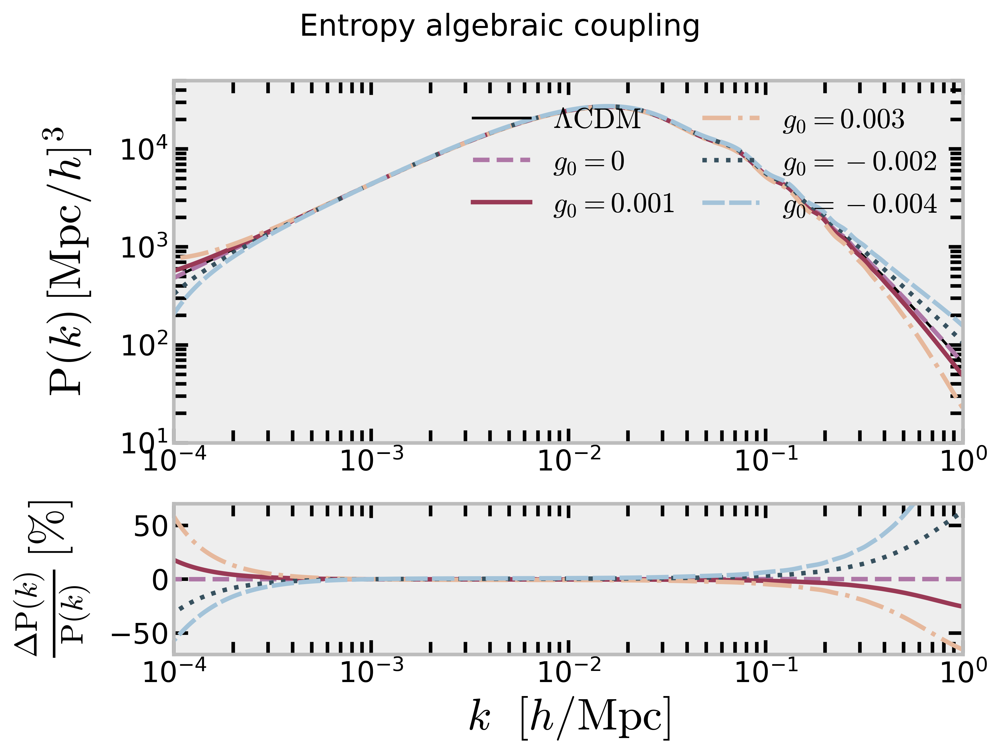

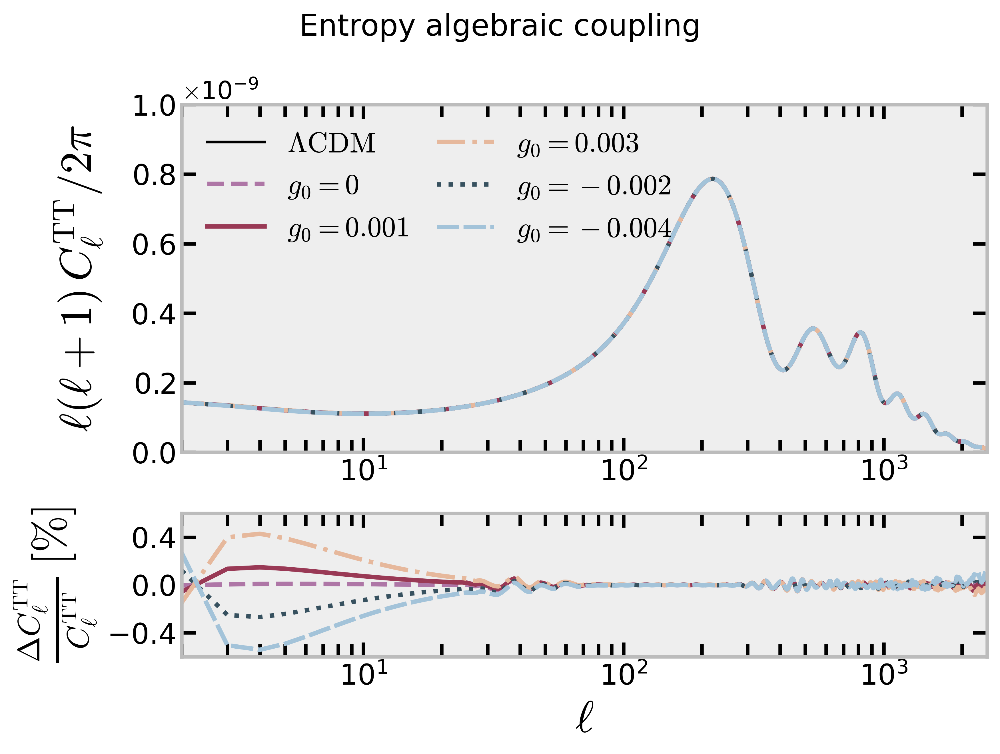

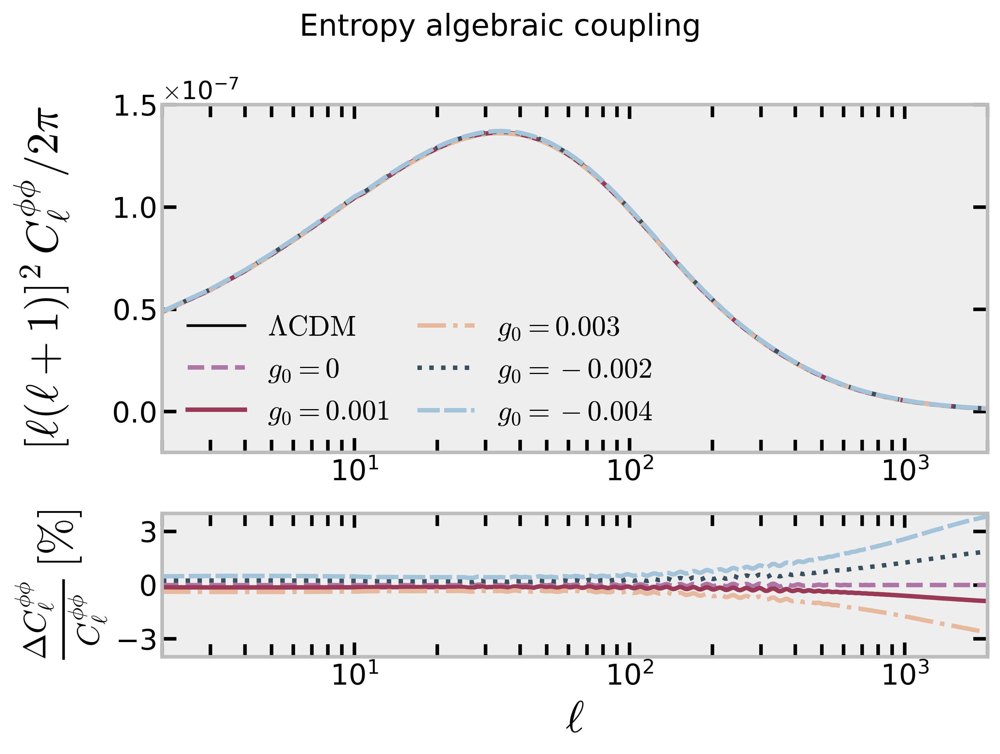

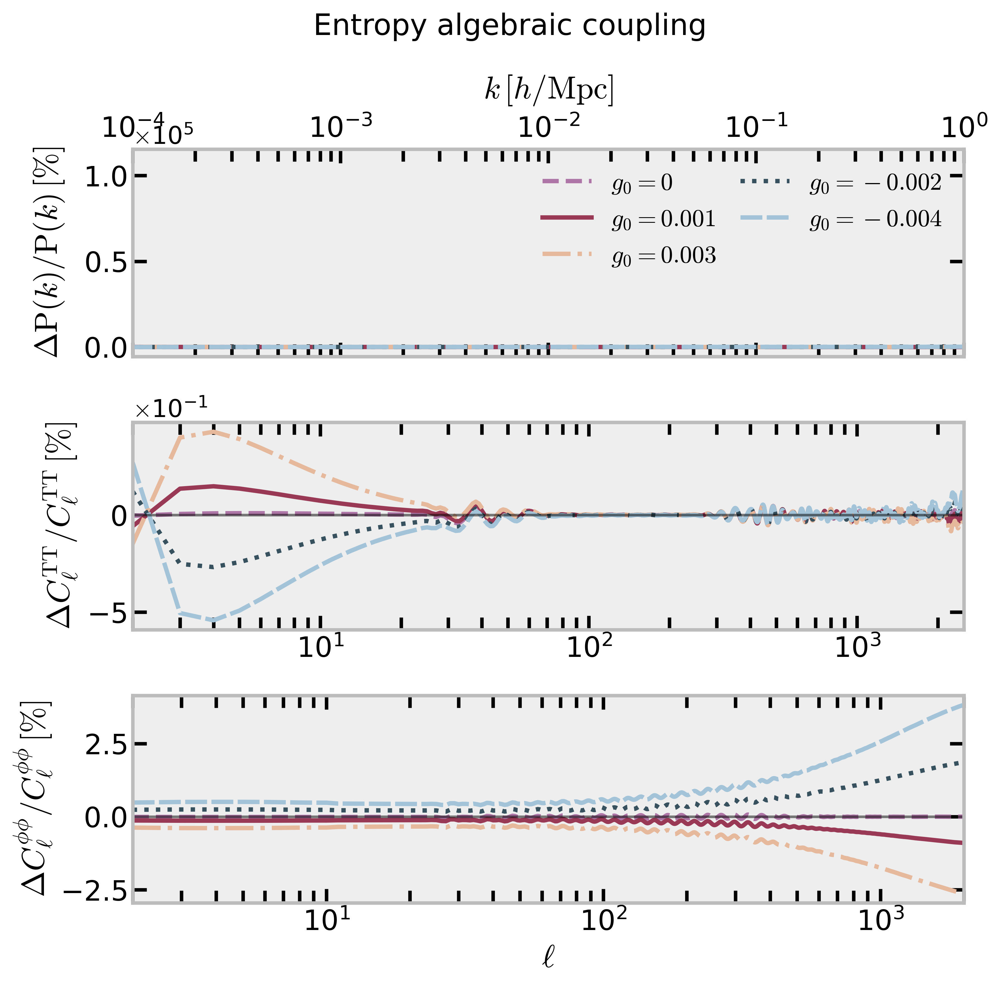

In [29]:
# Generate the entropy validation plots for both old benchmark branches.
for entropy_case in ['derivative', 'algebraic']:
    entropy_print_delta_summary(entropy_case)
    plot_entropy_mpk(entropy_case)
    plot_entropy_tt(entropy_case)
    plot_entropy_lensing(entropy_case)
    plot_entropy_summary(entropy_case)
